## Task 1

### Import Libraries

In [1]:
# libraries for numerical
import pandas as pd  
import numpy as np

# libraries for visualization
import matplotlib.pyplot as plt  
import seaborn as sns

# libraries for machine learning
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import metrics

# to plot the diagrams within the cells
%matplotlib inline

### Load the data and display first 5 rows.

In [2]:
cancer_data  = pd.read_csv("https://raw.githubusercontent.com/dphi-official/Datasets/master/cancer_death_rate/Training_set_label.csv" )
cancer_data.head()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,MedianAgeMale,MedianAgeFemale,Geography,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,TARGET_deathRate
0,19.0,8,481.5,50038,2704,11.1,0.0,"(48021.6, 51046.4]",48.4,49.6,46.4,"Hettinger County, North Dakota",2.25,65.9,10.8,25.0,57.4,6.8,37.1,12.2,57.4,1.1,81.2,56.0,35.7,34.7,9.9,96.032049,0.724914,0.000000,0.000000,62.511457,15.157116,160.3
1,88.0,34,486.0,59399,14844,9.7,0.0,"(54545.6, 61494.5]",41.9,41.3,43.2,"Mills County, Iowa",2.63,58.6,22.3,29.1,NaN,1.1,35.9,16.0,60.4,3.8,76.7,NaN,50.8,32.1,12.8,97.537344,0.719957,0.080743,0.040371,61.641045,3.293510,194.9
2,195.0,83,475.7,39721,25164,18.5,0.0,"(37413.8, 40362.7]",48.9,47.9,49.9,"Gladwin County, Michigan",2.30,57.2,24.9,36.2,NaN,3.5,40.2,7.6,41.2,11.0,61.6,NaN,32.1,49.8,21.6,97.576566,0.360770,0.411749,0.082350,53.978102,6.390328,196.5
3,116.0,55,496.6,30299,17917,28.1,0.0,"[22640, 34218.1]",44.2,42.7,45.2,"Fentress County, Tennessee",2.43,53.0,10.9,51.8,NaN,5.3,44.2,7.0,41.6,10.4,45.2,NaN,24.2,53.2,33.0,97.908650,0.161731,0.306731,0.340193,51.013143,5.124836,230.9
4,80.0,35,372.0,39625,14058,17.4,0.0,"(37413.8, 40362.7]",45.0,42.2,48.0,"Las Animas County, Colorado",2.36,52.2,12.6,31.2,NaN,0.2,28.3,10.5,49.3,9.2,56.6,NaN,33.4,43.0,24.7,82.672551,1.834103,0.682617,8.253465,50.566426,3.897033,162.2


### Perform Exploratory Data Analysis

In [ ]:
cancer_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3051 entries, 0 to 3050
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3051 non-null   float64
 1   avgDeathsPerYear         3051 non-null   int64  
 2   incidenceRate            3051 non-null   float64
 3   medIncome                3051 non-null   int64  
 4   popEst2015               3051 non-null   int64  
 5   povertyPercent           3051 non-null   float64
 6   studyPerCap              3051 non-null   float64
 7   binnedInc                3051 non-null   object 
 8   MedianAge                3051 non-null   float64
 9   MedianAgeMale            3051 non-null   float64
 10  MedianAgeFemale          3051 non-null   float64
 11  Geography                3051 non-null   object 
 12  AvgHouseholdSize         3051 non-null   float64
 13  PercentMarried           3051 non-null   float64
 14  PctNoHS18_24            

In [ ]:
cancer_data.isnull().sum()

avgAnnCount                   0
avgDeathsPerYear              0
incidenceRate                 0
medIncome                     0
popEst2015                    0
povertyPercent                0
studyPerCap                   0
binnedInc                     0
MedianAge                     0
MedianAgeMale                 0
MedianAgeFemale               0
Geography                     0
AvgHouseholdSize              0
PercentMarried                0
PctNoHS18_24                  0
PctHS18_24                    0
PctSomeCol18_24            2266
PctBachDeg18_24               0
PctHS25_Over                  0
PctBachDeg25_Over             0
PctEmployed16_Over          152
PctUnemployed16_Over          0
PctPrivateCoverage            0
PctPrivateCoverageAlone     604
PctEmpPrivCoverage            0
PctPublicCoverage             0
PctPublicCoverageAlone        0
PctWhite                      0
PctBlack                      0
PctAsian                      0
PctOtherRace                  0
PctMarri

In [ ]:
#consider droppin PctSomeCol18_24, it has way too much missing values
cancer_data.shape

(3051, 34)

In [ ]:
cancer_data.binnedInc.value_counts()

(51046.4, 54545.6]    318
(37413.8, 40362.7]    318
(54545.6, 61494.5]    315
(34218.1, 37413.8]    309
(42724.4, 45201]      306
(40362.7, 42724.4]    306
[22640, 34218.1]      301
(45201, 48021.6]      299
(48021.6, 51046.4]    297
(61494.5, 125635]     282
Name: binnedInc, dtype: int64

In [ ]:
cancer_data.Geography.value_counts()

Indian River County, Florida     2
Bernalillo County, New Mexico    2
Botetourt County, Virginia       2
Clay County, Kentucky            2
Sheridan County, North Dakota    2
                                ..
Harlan County, Nebraska          1
Carbon County, Pennsylvania      1
St. Charles Parish, Louisiana    1
Butler County, Iowa              1
Jones County, Georgia            1
Name: Geography, Length: 2285, dtype: int64

In [ ]:
cancer_data.TARGET_deathRate.value_counts()

173.6    12
184.3    12
165.3    11
179.9    11
174.7    11
         ..
197.2     1
135.8     1
235.2     1
254.3     1
230.6     1
Name: TARGET_deathRate, Length: 939, dtype: int64

In [ ]:
cancer_data.describe()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,TARGET_deathRate
count,3051.000000,3051.000000,3051.000000,3051.000000,3.051000e+03,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,785.000000,3051.000000,3051.000000,3051.000000,2899.000000,3051.000000,3051.000000,2447.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000
mean,570.668154,176.000983,449.007042,46902.917076,9.495799e+04,16.880367,158.695936,44.303540,39.600885,42.234579,2.473048,51.885480,18.225139,34.920190,41.247898,6.131957,34.909440,13.212750,54.115626,7.841069,64.519338,48.573314,41.342347,36.287545,19.198820,84.005243,9.166570,1.198561,1.864829,51.355837,5.608851,178.909767
std,1250.546532,445.042777,52.886386,11902.460659,2.761007e+05,6.340462,544.035590,38.704107,5.177629,5.253474,0.429926,6.812846,8.105799,9.021475,11.107006,4.552222,7.015728,5.360342,8.267656,3.454863,10.511932,10.011218,9.327793,7.748442,6.023164,16.126982,14.676772,2.369931,3.235204,6.524964,1.955201,27.570075
min,6.000000,3.000000,211.100000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,22.300000,0.022100,25.100000,0.000000,0.000000,7.100000,0.000000,7.500000,3.200000,17.600000,0.400000,23.400000,16.800000,14.300000,11.800000,2.600000,11.008762,0.000000,0.000000,0.000000,23.915652,0.000000,66.300000
25%,80.000000,29.000000,421.800000,38752.000000,1.236850e+04,12.200000,0.000000,37.900000,36.400000,39.200000,2.370000,47.800000,12.800000,29.300000,34.000000,3.100000,30.650000,9.300000,48.600000,5.500000,57.500000,41.300000,34.700000,31.000000,14.900000,78.012571,0.616576,0.261748,0.282825,47.736828,4.499936,161.400000
50%,171.000000,62.000000,453.549422,45098.000000,2.677700e+04,15.900000,0.000000,41.000000,39.500000,42.400000,2.500000,52.500000,17.200000,34.700000,41.000000,5.300000,35.400000,12.300000,54.400000,7.600000,65.300000,48.700000,41.300000,36.300000,18.800000,90.318790,2.276756,0.557031,0.791571,51.757925,5.384471,178.300000
75%,508.000000,148.000000,481.300000,52410.500000,6.853600e+04,20.400000,86.581336,43.900000,42.500000,45.300000,2.630000,56.500000,22.600000,40.700000,46.900000,8.100000,39.700000,16.100000,60.300000,9.700000,72.200000,55.700000,47.700000,41.400000,23.000000,95.577396,10.326954,1.189955,2.080241,55.465803,6.473896,195.500000
max,24965.000000,9445.000000,1206.900000,125635.000000,5.238216e+06,47.000000,9762.308998,525.600000,64.700000,65.700000,3.930000,72.500000,64.100000,72.500000,79.000000,51.800000,54.800000,40.400000,76.500000,29.400000,92.300000,78.900000,70.700000,65.100000,46.600000,100.000000,84.866024,35.640183,38.743747,71.703057,21.326165,362.800000


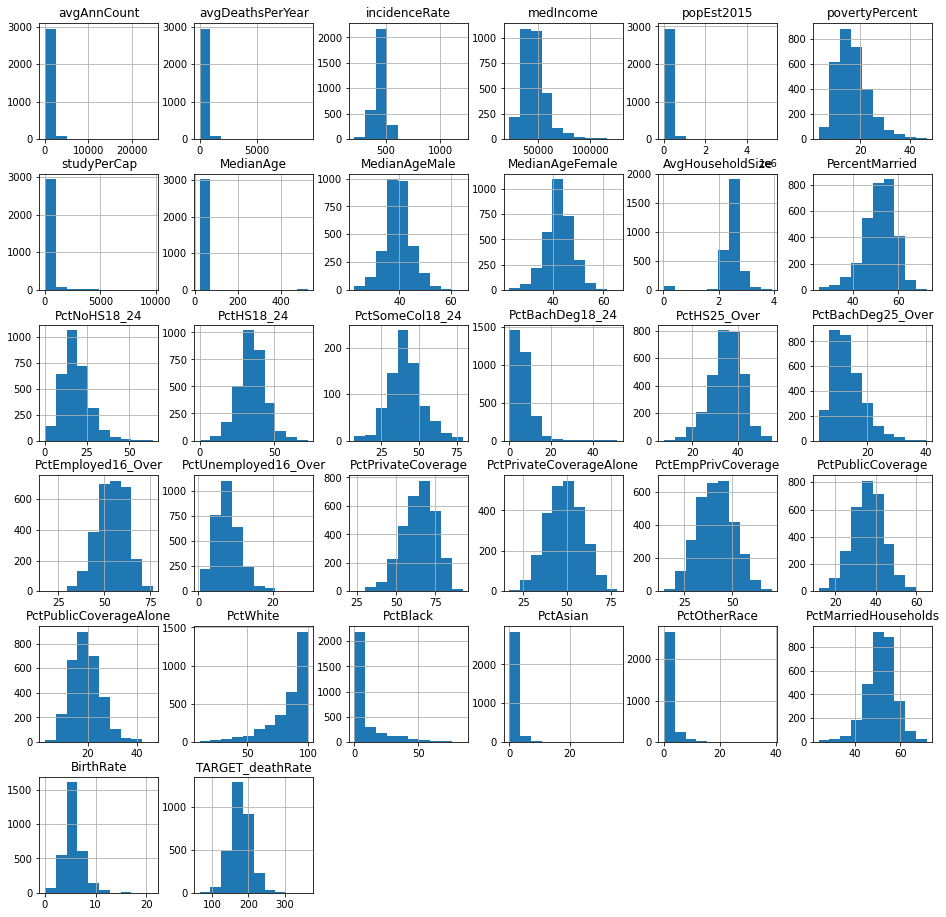

In [ ]:
cancer_data.hist(bins=10, figsize=(16,16))
plt.show()

In [ ]:
cancer_data.corr()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,TARGET_deathRate
avgAnnCount,1.000000,0.923935,0.093793,0.292551,0.907281,-0.153511,0.070595,-0.018056,-0.117826,-0.118879,0.056932,-0.092258,-0.149731,-0.177809,0.135715,0.293842,-0.314156,0.337281,0.211518,-0.017797,0.151717,0.223735,0.217377,-0.184398,-0.110135,-0.134860,0.033512,0.440741,0.207671,-0.095842,-0.028986,-0.130745
avgDeathsPerYear,0.923935,1.000000,0.083217,0.244401,0.971384,-0.078702,0.064497,-0.016642,-0.149103,-0.146657,0.081113,-0.181102,-0.140910,-0.145693,0.124088,0.266891,-0.301554,0.309534,0.129842,0.071778,0.069847,0.156071,0.176008,-0.143982,-0.041234,-0.190650,0.092127,0.456169,0.213360,-0.161171,-0.070212,-0.074008
incidenceRate,0.093793,0.083217,1.000000,-0.006377,0.046802,0.018940,0.064139,0.015603,-0.001209,0.004629,-0.085617,-0.122265,-0.179984,0.065147,0.015150,0.031113,0.138648,-0.053213,0.009715,0.105996,0.096089,0.099161,0.149924,0.065979,0.062519,-0.031335,0.118791,0.002370,-0.204575,-0.155923,-0.113258,0.467683
medIncome,0.292551,0.244401,-0.006377,1.000000,0.269641,-0.793994,0.041672,0.000035,-0.089085,-0.150649,0.108409,0.365952,-0.288185,-0.192084,0.209746,0.495539,-0.466977,0.709065,0.694584,-0.458752,0.729902,0.788437,0.746149,-0.753168,-0.723002,0.174797,-0.268332,0.450907,0.087813,0.448764,-0.005879,-0.433311
popEst2015,0.907281,0.971384,0.046802,0.269641,1.000000,-0.083109,0.059083,-0.013029,-0.187828,-0.191556,0.108130,-0.162652,-0.136246,-0.154262,0.108005,0.267584,-0.333157,0.330253,0.154495,0.048604,0.073981,0.171036,0.186544,-0.186896,-0.064535,-0.201226,0.086081,0.499890,0.244680,-0.128920,-0.054911,-0.111470
povertyPercent,-0.153511,-0.078702,0.018940,-0.793994,-0.083109,1.000000,-0.052453,-0.039496,-0.207178,-0.140043,0.065956,-0.644720,0.269000,0.089684,-0.172495,-0.387056,0.191345,-0.528803,-0.732775,0.654213,-0.819489,-0.757670,-0.677633,0.649896,0.797798,-0.508448,0.514195,-0.163345,0.038812,-0.606798,-0.037040,0.427118
studyPerCap,0.070595,0.064497,0.064139,0.041672,0.059083,-0.052453,1.000000,-0.027554,-0.040006,-0.036666,0.001118,-0.037337,-0.060354,-0.059989,0.139199,0.050189,-0.089984,0.114052,0.090686,-0.037289,0.095512,0.070741,0.092621,-0.060247,-0.067500,0.017619,-0.014936,0.065682,-0.024420,-0.045476,0.008558,-0.023890
MedianAge,-0.018056,-0.016642,0.015603,0.000035,-0.013029,-0.039496,-0.027554,1.000000,0.107618,0.113412,-0.025631,0.060273,0.005996,0.038764,-0.015009,-0.013868,0.050811,-0.018384,-0.014811,0.003946,0.021894,-0.011277,-0.016232,0.027074,-0.021316,0.029777,-0.005716,-0.024078,-0.028023,0.031896,0.000633,0.002772
MedianAgeMale,-0.117826,-0.149103,-0.001209,-0.089085,-0.187828,-0.207178,-0.040006,0.107618,1.000000,0.929571,-0.332021,0.444570,0.106684,0.250098,-0.243584,-0.042250,0.320815,-0.147587,-0.187813,-0.115568,0.068686,-0.174799,-0.232712,0.402511,0.010843,0.380859,-0.240541,-0.245138,-0.274713,0.216806,-0.086324,-0.002006
MedianAgeFemale,-0.118879,-0.146657,0.004629,-0.150649,-0.191556,-0.140043,-0.036666,0.113412,0.929571,1.000000,-0.356711,0.359423,0.157249,0.259973,-0.305402,-0.087830,0.354246,-0.199957,-0.278066,-0.089276,0.028907,-0.224679,-0.281330,0.463691,0.056223,0.314168,-0.158247,-0.264226,-0.279382,0.148140,-0.079924,0.034693


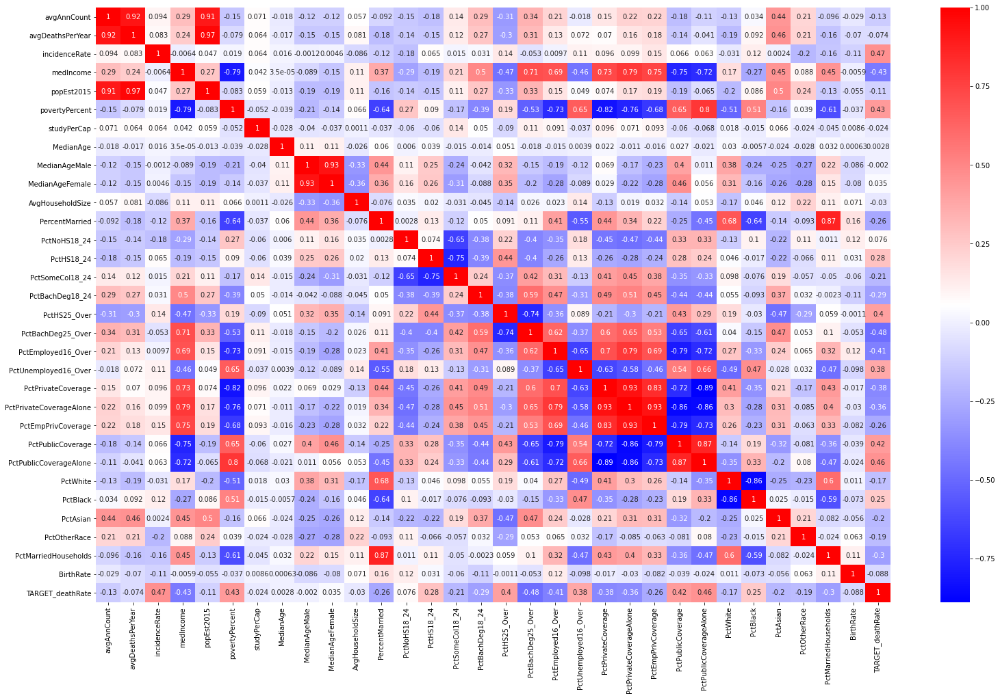

In [ ]:

plt.figure(figsize=(26, 16))
sns.heatmap(cancer_data.corr(), cmap='bwr', annot=True) 

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


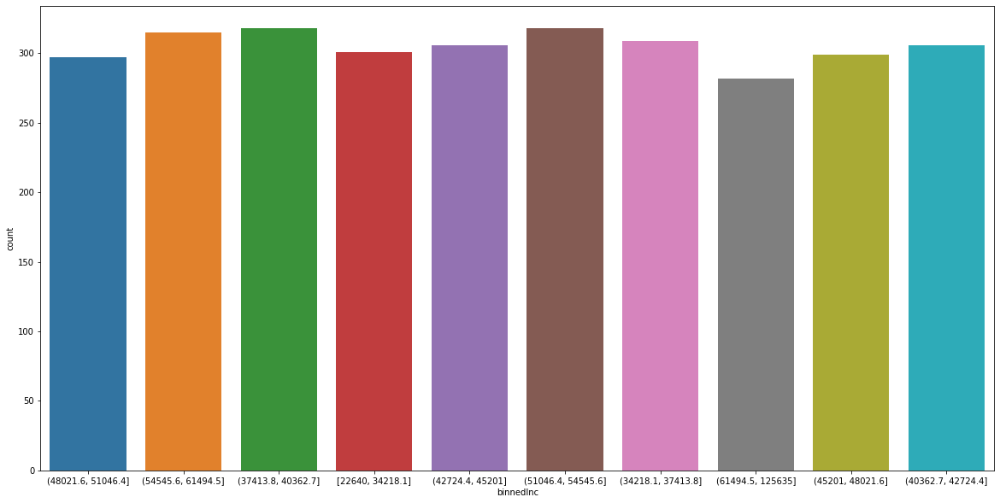

In [ ]:
plt.figure(figsize=(20,10))
sns.countplot(cancer_data.binnedInc)

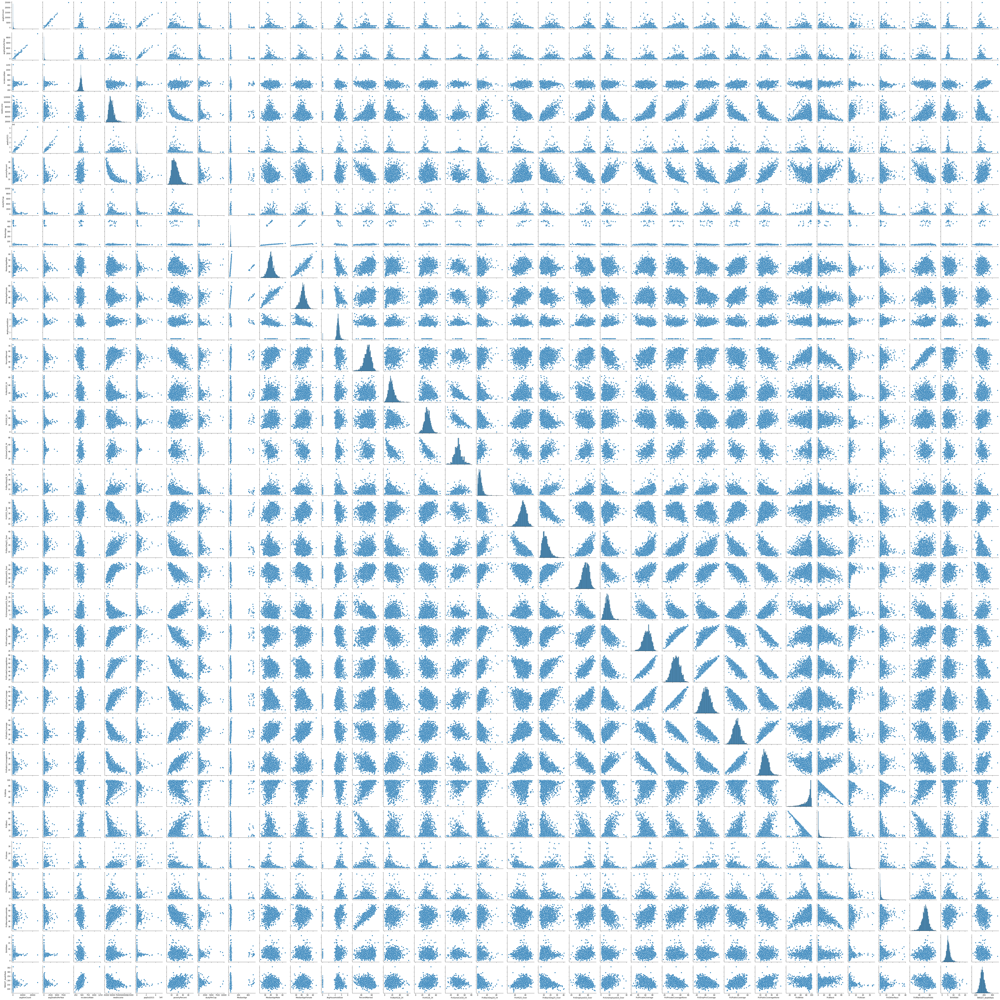

In [ ]:
sns.pairplot(cancer_data)


### Separate the Input and Target Features of the data

In [3]:
X=cancer_data.drop('TARGET_deathRate',axis=1)
y=cancer_data.TARGET_deathRate

### Split the data into Train and Test Sets

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# isnull().sum() will sum the number of missing values by columns
train_count_of_missval_by_col = (X_train.isnull().sum())
train_count_of_missval_by_col

# below code will display only the columns with missing values (in absolute number of rows)
train_count_of_missval_by_col[train_count_of_missval_by_col > 0]



PctSomeCol18_24            1804
PctEmployed16_Over          120
PctPrivateCoverageAlone     482
dtype: int64

In [ ]:
# below code will display only the columns with missing values (in percentage of missing values to the total rows)
(train_count_of_missval_by_col[train_count_of_missval_by_col > 0]/X_train.shape[0])*100

PctEmployed16_Over          4.918033
PctPrivateCoverageAlone    19.754098
dtype: float64

In [ ]:
X_train.PctPrivateCoverageAlone.dtype

dtype('float64')

In [5]:

cols= X_train.columns
num_cols = X_train.select_dtypes(include=np.number).columns
X_train.loc[:,num_cols]=X_train.loc[:,num_cols].fillna(X_train.loc[:,num_cols].mean())
print(num_cols)
print(X_train.loc[:,num_cols].mean())

Index(['avgAnnCount', 'avgDeathsPerYear', 'incidenceRate', 'medIncome',
       'popEst2015', 'povertyPercent', 'studyPerCap', 'MedianAge',
       'MedianAgeMale', 'MedianAgeFemale', 'AvgHouseholdSize',
       'PercentMarried', 'PctNoHS18_24', 'PctHS18_24', 'PctSomeCol18_24',
       'PctBachDeg18_24', 'PctHS25_Over', 'PctBachDeg25_Over',
       'PctEmployed16_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage',
       'PctPrivateCoverageAlone', 'PctEmpPrivCoverage', 'PctPublicCoverage',
       'PctPublicCoverageAlone', 'PctWhite', 'PctBlack', 'PctAsian',
       'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate'],
      dtype='object')
avgAnnCount                  572.399387
avgDeathsPerYear             176.176639
incidenceRate                448.771047
medIncome                  46949.352459
popEst2015                 94186.921721
povertyPercent                16.825369
studyPerCap                  159.358880
MedianAge                     43.727705
MedianAgeMale                 39.5804

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:1715: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, v)


In [ ]:
X_train.columns[X_train.isnull().mean() > 0] # select those variables with missing values

Index([], dtype='object')

In [ ]:
X_train.isnull().sum()

avgAnnCount                0
avgDeathsPerYear           0
incidenceRate              0
medIncome                  0
popEst2015                 0
povertyPercent             0
studyPerCap                0
binnedInc                  0
MedianAge                  0
MedianAgeMale              0
MedianAgeFemale            0
Geography                  0
AvgHouseholdSize           0
PercentMarried             0
PctNoHS18_24               0
PctHS18_24                 0
PctSomeCol18_24            0
PctBachDeg18_24            0
PctHS25_Over               0
PctBachDeg25_Over          0
PctEmployed16_Over         0
PctUnemployed16_Over       0
PctPrivateCoverage         0
PctPrivateCoverageAlone    0
PctEmpPrivCoverage         0
PctPublicCoverage          0
PctPublicCoverageAlone     0
PctWhite                   0
PctBlack                   0
PctAsian                   0
PctOtherRace               0
PctMarriedHouseholds       0
BirthRate                  0
dtype: int64

In [ ]:
cat_cols= list(set(cols) - set(num_cols))
print(cat_cols)

['Geography', 'binnedInc']


## Task 2

### Perform Data Preparation Steps

In [7]:
# detect columns with missing values in the training dataset

# isnull().sum() will sum the number of missing values by columns
train_count_of_missval_by_col = (X_train.isnull().sum())
train_count_of_missval_by_col

# below code will display only the columns with missing values (in absolute number of rows)
train_count_of_missval_by_col[train_count_of_missval_by_col > 0]


Series([], dtype: int64)

In [8]:
# below code will display only the columns with missing values (in percentage of missing values to the total rows)
(train_count_of_missval_by_col[train_count_of_missval_by_col > 0]/X_train.shape[0])*100

Series([], dtype: float64)

In [ ]:
X_train.head(3)

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,MedianAgeMale,MedianAgeFemale,Geography,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
351,238.0,95,459.2,52978,45549,14.4,0.0,"(51046.4, 54545.6]",39.3,38.8,39.8,"Monroe County, Wisconsin",2.49,53.4,16.2,46.9,41.276887,4.9,39.4,12.4,60.0,6.5,69.4,51.70000,44.4,34.7,17.0,94.034103,0.996157,0.713434,1.084508,51.056536,9.392151
1036,316.0,141,420.9,50243,63642,11.9,0.0,"(48021.6, 51046.4]",40.9,38.3,43.3,"Sauk County, Wisconsin",2.45,53.8,17.2,37.1,41.276887,9.3,36.6,15.3,64.9,5.5,71.9,55.50000,49.1,34.4,17.2,95.251778,0.534989,0.671514,0.612776,52.094272,4.992504
2726,94.0,27,406.2,108477,17785,4.2,0.0,"(61494.5, 125635]",43.5,41.8,45.1,"Los Alamos County, New Mexico",2.34,65.5,23.5,26.0,41.600000,8.9,10.8,24.9,62.1,3.5,89.6,48.72334,66.7,21.2,4.2,86.704945,0.484977,6.694911,2.737053,59.632305,5.543653


In [9]:
Xtrain=X_train.drop(['binnedInc','Geography'],axis=1)
Xtrain.shape

(2440, 31)

In [ ]:
Xtrain.head(3)

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
351,238.0,95,459.2,52978,45549,14.4,0.0,39.3,38.8,39.8,2.49,53.4,16.2,46.9,41.276887,4.9,39.4,12.4,60.0,6.5,69.4,51.70000,44.4,34.7,17.0,94.034103,0.996157,0.713434,1.084508,51.056536,9.392151
1036,316.0,141,420.9,50243,63642,11.9,0.0,40.9,38.3,43.3,2.45,53.8,17.2,37.1,41.276887,9.3,36.6,15.3,64.9,5.5,71.9,55.50000,49.1,34.4,17.2,95.251778,0.534989,0.671514,0.612776,52.094272,4.992504
2726,94.0,27,406.2,108477,17785,4.2,0.0,43.5,41.8,45.1,2.34,65.5,23.5,26.0,41.600000,8.9,10.8,24.9,62.1,3.5,89.6,48.72334,66.7,21.2,4.2,86.704945,0.484977,6.694911,2.737053,59.632305,5.543653


In [ ]:
Xtrain.describe()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,2440.000000,2440.000000,2440.000000,2440.000000,2.440000e+03,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.00000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000,2440.000000
mean,572.399387,176.176639,448.771047,46949.352459,9.418692e+04,16.825369,159.358880,43.727705,39.580492,42.241844,2.46707,51.826025,18.129672,34.948156,6.168033,34.881393,13.295451,54.259871,7.819139,64.670000,48.723340,41.475697,36.200082,19.134344,84.067692,9.182983,1.181185,1.839571,51.258105,5.567807
std,1260.902458,451.987703,50.734354,11753.475612,2.775358e+05,6.353332,533.177220,35.415130,5.136279,5.226898,0.43249,6.824075,8.185587,9.121828,4.564280,6.988957,5.336586,8.043976,3.471864,10.435784,8.836397,9.270774,7.674219,5.994724,16.187338,14.807157,2.297872,3.237217,6.528605,1.926556
min,6.000000,3.000000,211.100000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,22.300000,0.02210,25.100000,0.000000,0.000000,0.000000,7.500000,3.200000,17.600000,0.400000,23.400000,16.800000,14.300000,13.500000,2.600000,11.008762,0.000000,0.000000,0.000000,23.915652,0.000000
25%,80.000000,29.000000,422.200000,39022.000000,1.241250e+04,12.175000,0.000000,37.800000,36.400000,39.300000,2.37000,47.800000,12.775000,29.200000,3.100000,30.600000,9.400000,49.200000,5.500000,57.500000,43.300000,34.900000,30.900000,14.800000,78.291346,0.615855,0.265215,0.288668,47.617864,4.487234
50%,171.500000,62.000000,453.549422,45213.000000,2.671000e+04,15.800000,0.000000,40.900000,39.500000,42.300000,2.49000,52.500000,17.000000,34.600000,5.450000,35.400000,12.400000,54.259871,7.600000,65.300000,48.723340,41.500000,36.200000,18.700000,90.335614,2.270295,0.568864,0.784317,51.712230,5.354752
75%,522.250000,149.000000,480.575000,52388.750000,6.969550e+04,20.300000,92.475571,43.900000,42.400000,45.300000,2.62000,56.500000,22.300000,40.700000,8.100000,39.700000,16.300000,60.100000,9.600000,72.325000,54.000000,47.900000,41.400000,22.900000,95.589600,10.259338,1.223475,2.038654,55.444772,6.450384
max,24965.000000,9445.000000,718.900000,125635.000000,5.238216e+06,47.000000,9762.308998,525.600000,64.700000,65.700000,3.93000,72.500000,64.100000,72.500000,51.800000,54.800000,40.400000,76.500000,29.400000,92.300000,78.200000,70.700000,65.100000,46.600000,100.000000,84.866024,35.640183,38.743747,71.703057,17.877095


In [ ]:
from sklearn.feature_selection import VarianceThreshold

X_train_var = VarianceThreshold()

# Perform variance thresholding
X_train_var.fit_transform(Xtrain)

# Print the name and variance of each feature
for feature in zip(Xtrain.columns, X_train_var.variances_):
    print(feature)

('avgAnnCount', 24959.0)
('avgDeathsPerYear', 9442.0)
('incidenceRate', 507.79999999999995)
('medIncome', 102995.0)
('popEst2015', 5237389.0)
('povertyPercent', 40.34827855247246)
('studyPerCap', 9762.308998)
('MedianAge', 503.3)
('MedianAgeMale', 26.37055385649019)
('MedianAgeFemale', 27.30926135279495)
('AvgHouseholdSize', 0.18697131639169576)
('PercentMarried', 46.54890878628057)
('PctNoHS18_24', 64.1)
('PctHS18_24', 72.5)
('PctBachDeg18_24', 20.824117441547973)
('PctHS25_Over', 47.3)
('PctBachDeg25_Over', 28.467483403319)
('PctEmployed16_Over', 58.9)
('PctUnemployed16_Over', 12.048900078943833)
('PctPrivateCoverage', 68.9)
('PctPrivateCoverageAlone', 61.400000000000006)
('PctEmpPrivCoverage', 56.400000000000006)
('PctPublicCoverage', 51.599999999999994)
('PctPublicCoverageAlone', 35.92199260279495)
('PctWhite', 88.99123792)
('PctBlack', 84.86602358)
('PctAsian', 5.278051693595767)
('PctOtherRace', 10.475280458918487)
('PctMarriedHouseholds', 42.605221234115945)
('BirthRate', 3.7100

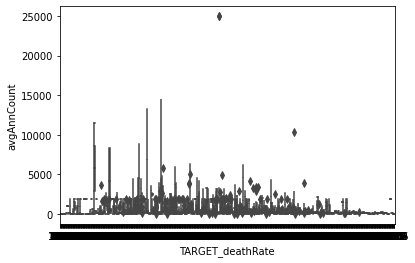

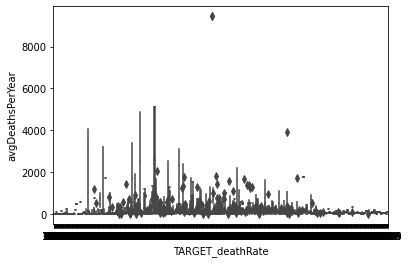

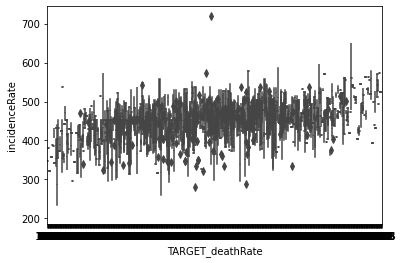

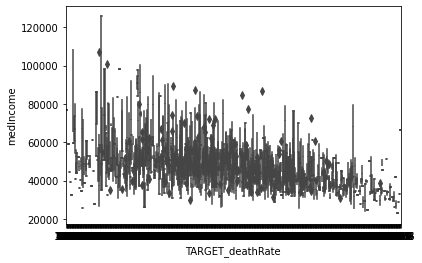

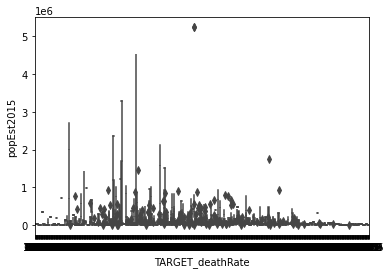

...

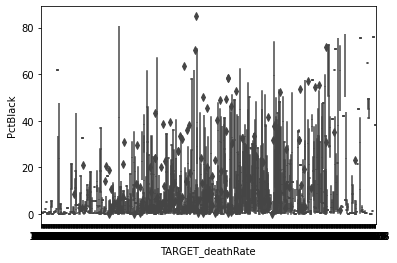

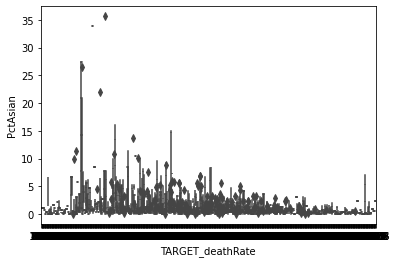

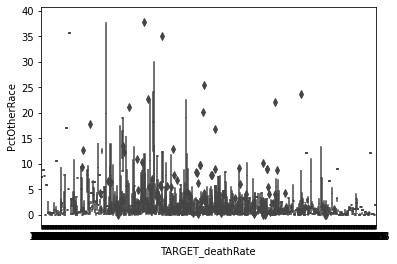

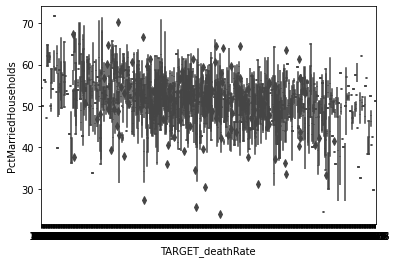

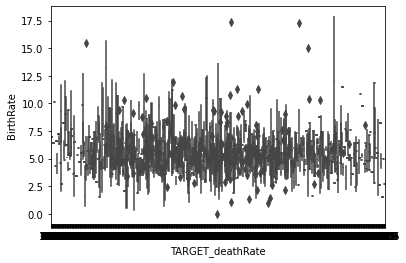

In [ ]:
for feature in Xtrain.columns:
  sns.boxplot(x=y_train, y=feature, data=Xtrain)
  plt.show()


In [10]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit_transform(Xtrain)
Xtrain.head()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
351,238.0,95,459.2,52978,45549,14.4,0.00000,39.3,38.8,39.8,2.49,53.4,16.2,46.9,41.276887,4.9,39.4,12.4,60.0,6.5,69.4,51.70000,44.4,34.7,17.0,94.034103,0.996157,0.713434,1.084508,51.056536,9.392151
1036,316.0,141,420.9,50243,63642,11.9,0.00000,40.9,38.3,43.3,2.45,53.8,17.2,37.1,41.276887,9.3,36.6,15.3,64.9,5.5,71.9,55.50000,49.1,34.4,17.2,95.251778,0.534989,0.671514,0.612776,52.094272,4.992504
2726,94.0,27,406.2,108477,17785,4.2,0.00000,43.5,41.8,45.1,2.34,65.5,23.5,26.0,41.600000,8.9,10.8,24.9,62.1,3.5,89.6,48.72334,66.7,21.2,4.2,86.704945,0.484977,6.694911,2.737053,59.632305,5.543653
889,131.0,56,494.2,46001,20872,15.4,0.00000,43.9,42.9,44.8,2.46,56.5,28.8,40.5,41.276887,2.8,43.7,6.0,54.2,8.0,62.3,46.50000,40.8,35.8,19.5,97.272556,0.608720,0.184032,0.184032,54.507190,5.925433
1929,208.0,87,382.1,46336,40946,15.5,73.26723,44.2,42.4,45.5,2.40,58.6,29.0,40.7,27.500000,2.7,31.6,15.3,51.6,10.2,54.1,37.20000,29.7,42.8,24.0,92.581159,0.646821,0.438564,3.192454,54.413168,3.819022


In [11]:
# Determine outlier using the Standard deviation method for avgAnnCount column

# calcuate the mean of avgAnnCount
avg_ann_mean = Xtrain.avgAnnCount.mean()
# calculate the standard deviation
avg_ann_std = Xtrain.avgAnnCount.std()
# Lower limit threshold is Mean - 3* SD
ll = avg_ann_mean - (3 * avg_ann_std)
# Higher limit threshold is Mean + 3* SD
hh = avg_ann_mean + (3 * avg_ann_std)

# filter the rows where avgAnnCount is an outlier. i.e. avgAnnCount less than the ll or greater than hh
# the usage of & between means it is an and condition
# the usage of | between means it is an or condition
filt_outliers_train = Xtrain[(Xtrain.avgAnnCount < ll) | (Xtrain.avgAnnCount > hh)]
filt_outliers_train.head()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
1713,4749.0,1672,490.8,79576,819264,7.1,239.239122,41.1,39.5,42.5,2.57,53.9,11.4,28.8,41.276887,17.9,24.8,26.3,64.0,6.4,83.4,68.40000,60.0,24.3,9.6,80.696336,8.869577,7.028673,1.096350,55.176816,4.502231
2371,14477.0,5108,433.8,54230,4538028,17.3,391.359419,32.8,32.0,33.6,2.88,47.2,19.9,30.5,40.900000,8.8,23.3,18.9,63.2,7.5,54.7,47.60000,42.8,27.5,19.8,63.121729,18.861747,6.572709,8.734237,46.913495,6.028644
1889,24965.0,9445,470.8,55058,5238216,17.1,371.118717,35.9,34.7,37.1,2.65,41.9,14.9,26.7,41.276887,15.5,24.0,21.5,59.0,10.7,61.5,48.72334,46.3,32.6,22.0,56.842582,23.982596,6.772830,9.847733,41.008791,4.994881
179,5021.0,1788,500.1,60387,859470,13.0,250.154165,39.8,38.1,41.1,2.56,44.7,12.6,29.9,44.000000,13.5,30.2,18.4,59.9,9.5,69.1,56.40000,50.8,34.3,20.6,75.012410,12.841095,3.895391,5.554589,45.043064,4.240825
1723,6346.0,2389,452.0,55803,1501335,18.1,239.120516,35.5,34.2,36.8,2.76,45.0,13.9,29.5,41.276887,7.2,22.3,19.1,55.3,11.8,63.2,48.72334,45.4,35.2,21.6,59.586774,9.957417,15.041628,6.886533,44.789283,5.384471


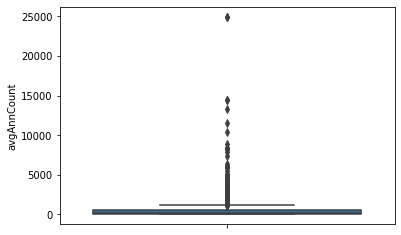

In [12]:
# IQR method for outlier Age
# Calculate Q1, Q2 and IQR
q1 = Xtrain.avgAnnCount.quantile(0.25)                 
q3 = Xtrain.avgAnnCount.quantile(0.75)
iqr = q3 - q1
whisker_width = 1.5
lower_whisker = q1 - whisker_width*iqr
upper_whisker = q3 + whisker_width*iqr
# Apply filter with respect to IQR, including optional whiskers
outlier_avg_ann_train = Xtrain[(Xtrain.avgAnnCount < q1 - whisker_width*iqr) | (Xtrain.avgAnnCount  > q3 + whisker_width*iqr)]
outlier_avg_ann_train

# boxplot with 1.5 whiskers
sns.boxplot(y='avgAnnCount', data = Xtrain, whis=1.5)

In [13]:
# Outlier treatment
# Top coding - ceiling the uppper limit of the column with the outer whisker value
Xtrain.loc[Xtrain.avgAnnCount>upper_whisker,'avgAnnCount'] = upper_whisker

# Bottom / Zero coding - ceiling the lower limit of the column with lower whisker or zero

Xtrain.loc[Xtrain.avgAnnCount<0,'avgAnnCount'] = 0

# display of minimum and maximum after outlier treatment
Xtrain['avgAnnCount'].min()
Xtrain['avgAnnCount'].max()

1185.625

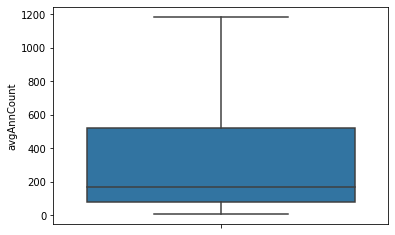

In [14]:
sns.boxplot(y='avgAnnCount', data = Xtrain, whis=1.5)

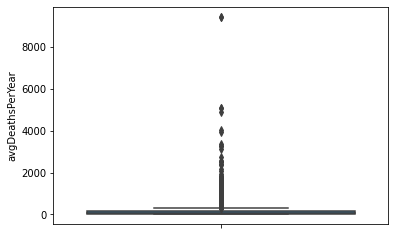

In [15]:

# Calculate Q1, Q2 and IQR
q1_avgD = Xtrain.avgDeathsPerYear.quantile(0.25)                 
q3_avgD = Xtrain.avgDeathsPerYear.quantile(0.75)
iqr_avgD = q3_avgD - q1_avgD
whisker_width_avgD = 1.5
lower_whisker_avgD = q1_avgD - whisker_width_avgD*iqr_avgD
upper_whisker_avgD = q3_avgD + whisker_width_avgD*iqr_avgD
# Apply filter with respect to IQR, including optional whiskers
outlier_avg_death_train = Xtrain[(Xtrain.avgDeathsPerYear < q1_avgD - whisker_width_avgD*iqr_avgD) | (Xtrain.avgDeathsPerYear  > q3_avgD + whisker_width_avgD*iqr_avgD)]
outlier_avg_death_train

# boxplot with 1.5 whiskers
sns.boxplot(y='avgDeathsPerYear', data = Xtrain, whis=1.5)

In [ ]:
outlier_avg_death_train

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
912,1083.000,392,458.400000,58205,274458,12.6,29.148358,33.2,32.2,34.3,2.59,49.1,8.2,23.3,58.600000,9.9,26.6,19.0,62.500000,4.9,74.8,61.20000,52.3,24.3,12.4,79.069222,4.525453,4.242519,1.342819,50.038277,4.927710
2798,1185.625,1216,451.000000,59049,1034070,15.2,307.522702,34.5,33.4,35.6,2.57,45.3,14.7,25.0,44.800000,15.5,19.1,28.4,65.300000,8.9,67.9,58.50000,50.5,24.6,15.4,56.675735,30.940090,5.166881,4.078914,43.175630,5.350192
838,1007.000,387,442.600000,49905,220358,18.0,154.294376,37.8,36.4,39.3,2.33,45.8,8.9,23.8,41.276887,11.5,22.1,24.7,59.000000,8.9,70.0,54.80000,43.5,29.1,14.2,81.051757,14.364755,1.383447,1.007081,43.021164,4.936554
1451,1185.625,753,429.500000,65359,631096,11.2,456.348955,36.1,35.0,37.4,2.63,50.5,16.5,31.1,41.276887,12.3,20.4,26.0,65.700000,7.2,70.3,59.10000,51.1,26.0,15.3,73.069652,10.240502,5.373247,5.817264,49.057713,5.782072
1644,1121.000,451,482.300000,42056,213442,16.7,768.358617,39.8,38.3,41.1,2.61,48.2,18.7,36.8,41.276887,4.9,30.1,13.5,55.000000,11.2,60.9,47.80000,42.1,34.9,20.5,76.632810,15.219702,1.397475,4.068501,47.481242,4.970819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646,1185.625,662,444.200000,46139,311003,15.3,234.724424,37.2,34.9,39.6,2.53,41.3,12.9,30.9,41.276887,6.7,28.9,16.4,52.400000,9.4,65.5,48.20000,36.3,35.0,18.2,68.961600,21.604038,2.893640,1.201004,41.925919,4.387164
1528,1185.625,552,434.600000,40386,288072,20.6,829.653698,35.6,34.5,37.2,2.31,47.4,8.2,23.1,58.900000,9.8,27.9,19.0,58.900000,6.8,67.6,54.40000,46.9,29.5,15.9,91.037972,3.142236,1.769737,0.727739,44.698977,5.445266
1082,1185.625,5108,433.800000,54230,4538028,17.3,391.359419,32.8,32.0,33.6,2.88,47.2,19.9,30.5,40.900000,8.8,23.3,18.9,63.200000,7.5,54.7,47.60000,42.8,27.5,19.8,63.121729,18.861747,6.572709,8.734237,46.913495,6.028644
459,796.000,333,480.800000,36014,153721,28.2,377.306939,35.6,34.1,37.5,2.59,37.7,17.6,35.2,41.276887,5.8,32.6,14.5,50.200000,12.4,55.9,43.60000,37.9,38.0,24.1,42.947757,53.090766,1.719461,0.480570,36.908827,5.466864


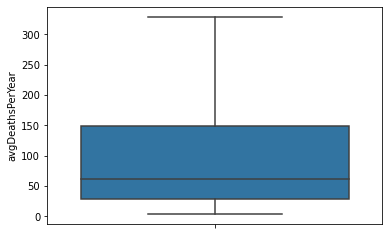

In [16]:
Xtrain.loc[Xtrain.avgDeathsPerYear>upper_whisker_avgD,'avgDeathsPerYear'] = upper_whisker_avgD

Xtrain.loc[Xtrain.avgDeathsPerYear<0,'avgDeathsPerYear'] = 0
sns.boxplot(y='avgDeathsPerYear', data = Xtrain, whis=1.5)

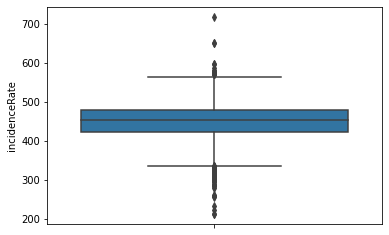

In [17]:
# Calculate Q1, Q2 and IQR
q1_inc = Xtrain.incidenceRate.quantile(0.25)                 
q3_inc = Xtrain.incidenceRate.quantile(0.75)
iqr_inc = q3_inc - q1_inc
whisker_width_inc = 1.5
lower_whisker_inc = q1_inc - whisker_width_inc*iqr_inc
upper_whisker_inc = q3_inc + whisker_width_inc*iqr_inc
# Apply filter with respect to IQR, including optional whiskers
outlier_inc_train = Xtrain[(Xtrain.incidenceRate < q1_inc - whisker_width_inc*iqr_inc) | (Xtrain.incidenceRate  > q3_inc + whisker_width_inc*iqr_inc)]


# boxplot with 1.5 whiskers
sns.boxplot(y='incidenceRate', data = Xtrain, whis=1.5)

In [ ]:
outlier_inc_train

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
3013,51.0,19.0,323.1,44817,16203,17.8,0.000000,35.8,36.0,34.3,3.1700,49.4,30.0,34.1,41.276887,7.0,35.2,6.6,52.000000,4.8,64.1,54.00000,50.7,23.9,12.7,84.797874,4.289239,0.158158,9.318656,55.312284,5.522289
498,45.0,23.0,323.8,35069,11388,26.0,0.000000,37.3,35.3,39.1,2.8000,43.1,28.5,39.4,41.276887,0.0,33.3,5.7,54.259871,10.9,43.6,48.72334,25.9,39.8,22.1,85.713052,0.855144,0.371426,12.274337,45.516891,7.840671
2484,16.0,9.0,312.8,47293,2967,13.8,0.000000,54.5,54.4,55.1,2.3800,52.4,40.7,39.8,41.276887,0.0,34.5,14.8,42.400000,8.0,58.8,36.30000,31.2,49.0,25.5,96.425025,0.099305,0.033102,0.397219,51.916933,2.073733
1656,405.0,165.0,317.6,86419,153511,9.6,58.627720,36.0,35.9,36.2,2.2100,44.1,14.4,23.7,41.276887,23.9,12.1,29.8,74.200000,4.5,76.4,48.72334,57.3,17.6,8.6,64.094699,21.374946,6.586746,3.159763,36.216152,6.214828
1939,205.0,134.0,296.0,45448,58615,14.3,0.000000,39.7,38.4,40.9,2.6200,57.6,13.6,32.3,41.276887,5.1,33.1,11.8,56.800000,6.1,66.0,50.10000,42.9,32.4,15.7,90.955646,0.976572,1.444443,0.515508,57.978820,4.480398
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
627,40.0,12.0,283.5,48940,16067,14.9,248.957491,34.3,34.1,34.8,2.3400,43.0,10.2,20.2,56.600000,13.1,17.0,40.4,54.259871,7.8,69.1,48.72334,35.3,22.2,13.4,95.661619,0.715609,0.626158,0.421698,42.229998,6.455696
540,45.0,19.0,334.6,54421,8564,10.4,0.000000,44.8,42.8,46.7,2.3900,64.4,14.0,28.4,41.276887,10.8,40.6,13.1,67.500000,2.2,83.7,48.72334,43.6,28.0,8.9,98.674352,0.080692,0.023055,0.080692,60.671329,6.343284
2454,21.0,7.0,211.1,34258,6876,21.8,0.000000,41.0,38.9,42.3,0.0277,54.7,59.0,27.0,41.276887,2.8,17.3,14.0,47.600000,9.6,35.2,28.90000,25.2,36.1,22.7,91.319825,0.013691,3.436473,3.162651,49.734245,6.324111
201,192.0,93.0,579.2,31265,27565,27.5,834.391438,41.4,40.2,41.8,2.4700,53.6,23.0,35.5,33.900000,7.6,32.2,7.3,41.300000,13.9,48.3,48.72334,33.3,48.4,32.1,96.344638,1.433615,0.559894,0.000000,50.803249,4.955914


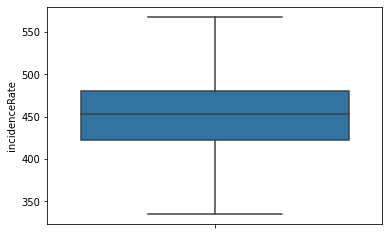

In [18]:
Xtrain.loc[Xtrain.incidenceRate>upper_whisker_inc,'incidenceRate'] = upper_whisker_inc
Xtrain.loc[Xtrain.incidenceRate<lower_whisker_inc,'incidenceRate'] = lower_whisker_inc

Xtrain.loc[Xtrain.incidenceRate<0,'incidenceRate'] = 0
sns.boxplot(y='incidenceRate', data = Xtrain, whis=1.5)

In [ ]:
lower_whisker_inc

334.6375

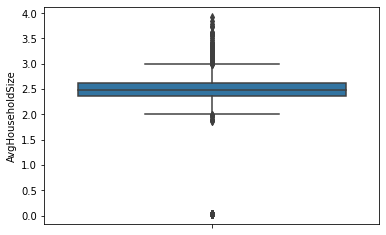

In [19]:
sns.boxplot(y='AvgHouseholdSize', data = Xtrain, whis=1.5)

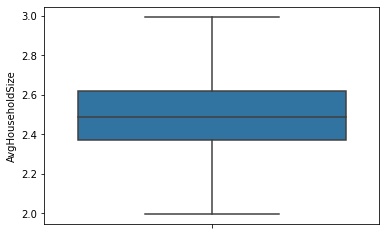

In [53]:
q1_c = Xtrain.AvgHouseholdSize.quantile(0.25)                 
q3_c = Xtrain.AvgHouseholdSize.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = Xtrain[(Xtrain.AvgHouseholdSize < q1_c - whisker_width_c*iqr_c) | (Xtrain.AvgHouseholdSize  > q3_c + whisker_width_c*iqr_c)]
Xtrain.loc[Xtrain.AvgHouseholdSize > upper_whisker_c, 'AvgHouseholdSize'] = upper_whisker_c
Xtrain.loc[Xtrain.AvgHouseholdSize<lower_whisker_c,'AvgHouseholdSize'] = lower_whisker_c

Xtrain.loc[Xtrain.AvgHouseholdSize < 0, 'AvgHouseholdSize'] = 0
sns.boxplot(y='AvgHouseholdSize', data = Xtrain, whis=1.5)

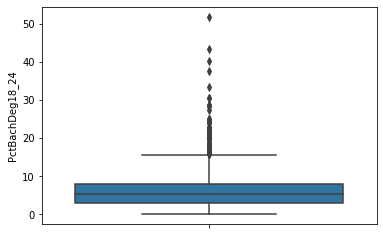

In [54]:
sns.boxplot(y='PctBachDeg18_24', data = Xtrain, whis=1.5)

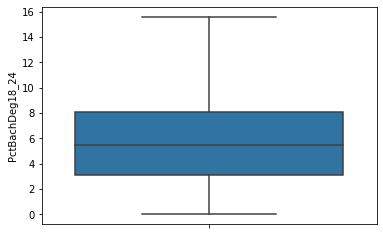

In [55]:
q1_c = Xtrain.PctBachDeg18_24.quantile(0.25)                 
q3_c = Xtrain.PctBachDeg18_24.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = Xtrain[(Xtrain.PctBachDeg18_24 < q1_c - whisker_width_c*iqr_c) | (Xtrain.PctBachDeg18_24  > q3_c + whisker_width_c*iqr_c)]
Xtrain.loc[Xtrain.PctBachDeg18_24 > upper_whisker_c, 'PctBachDeg18_24'] = upper_whisker_c

Xtrain.loc[Xtrain.PctBachDeg18_24 < 0, 'PctBachDeg18_24'] = 0
sns.boxplot(y='PctBachDeg18_24', data = Xtrain, whis=1.5)

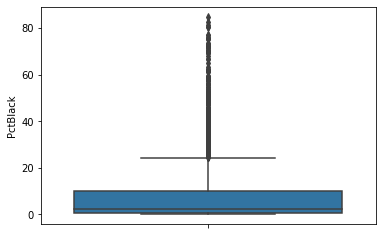

In [56]:
sns.boxplot(y='PctBlack', data = Xtrain, whis=1.5)

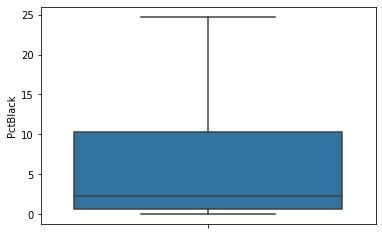

In [57]:
q1_c = Xtrain.PctBlack.quantile(0.25)                 
q3_c = Xtrain.PctBlack.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = Xtrain[(Xtrain.PctBlack < q1_c - whisker_width_c*iqr_c) | (Xtrain.PctBlack  > q3_c + whisker_width_c*iqr_c)]
Xtrain.loc[Xtrain.PctBlack > upper_whisker_c, 'PctBlack'] = upper_whisker_c

Xtrain.loc[Xtrain.PctBlack < 0, 'PctBlack'] = 0
sns.boxplot(y='PctBlack', data = Xtrain, whis=1.5)

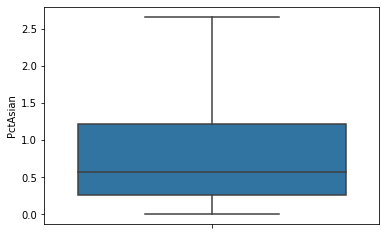

In [58]:
q1_c = Xtrain.PctAsian.quantile(0.25)                 
q3_c = Xtrain.PctAsian.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = Xtrain[(Xtrain.PctAsian < q1_c - whisker_width_c*iqr_c) | (Xtrain.PctAsian  > q3_c + whisker_width_c*iqr_c)]
Xtrain.loc[Xtrain.PctAsian > upper_whisker_c, 'PctAsian'] = upper_whisker_c

Xtrain.loc[Xtrain.PctAsian < 0, 'PctAsian'] = 0
sns.boxplot(y='PctAsian', data = Xtrain, whis=1.5)

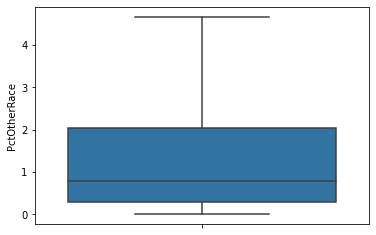

In [59]:
sns.boxplot(y='PctOtherRace', data = Xtrain, whis=1.5)

In [26]:

q1_c = Xtrain.PctOtherRace.quantile(0.25)                 
q3_c = Xtrain.PctOtherRace.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = Xtrain[(Xtrain.PctOtherRace < q1_c - whisker_width_c*iqr_c) | (Xtrain.PctOtherRace  > q3_c + whisker_width_c*iqr_c)]
Xtrain.loc[Xtrain.PctOtherRace > upper_whisker_c, 'PctOtherRace'] = upper_whisker_c
#Xtrain.loc[Xtrain.PctBlack<lower_whisker_c,'AvgHouseholdSize'] = lower_whisker_c

Xtrain.loc[Xtrain.PctOtherRace < 0, 'PctOtherRace'] = 0


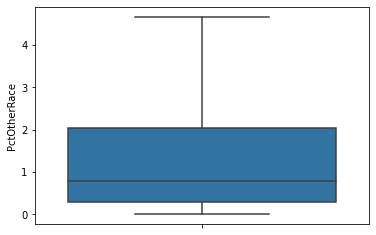

In [61]:

#sns.boxplot(y='AvgHouseholdSize', data = Xtrain, whis=1.5)
sns.boxplot(y='PctOtherRace', data = Xtrain, whis=1.5)

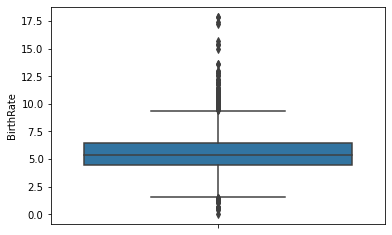

In [62]:
sns.boxplot(y='BirthRate', data = Xtrain, whis=1.5)

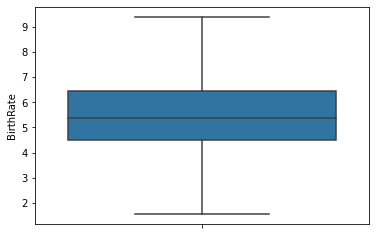

In [64]:
q1_c = Xtrain.BirthRate.quantile(0.25)                 
q3_c = Xtrain.BirthRate.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = Xtrain[(Xtrain.BirthRate < q1_c - whisker_width_c*iqr_c) | (Xtrain.BirthRate  > q3_c + whisker_width_c*iqr_c)]
Xtrain.loc[Xtrain.BirthRate > upper_whisker_c, 'BirthRate'] = upper_whisker_c
Xtrain.loc[Xtrain.BirthRate < lower_whisker_c, 'BirthRate'] = lower_whisker_c

Xtrain.loc[Xtrain.PctAsian < 0, 'BirthRate'] = 0
sns.boxplot(y='BirthRate', data = Xtrain, whis=1.5)

TEST DATA PREPROCESSING

In [28]:
cols= X_test.columns
num_cols = X_test.select_dtypes(include=np.number).columns
X_test.loc[:,num_cols]=X_test.loc[:,num_cols].fillna(X_test.loc[:,num_cols].mean())
print(num_cols)
print(X_test.loc[:,num_cols].mean())

Index(['avgAnnCount', 'avgDeathsPerYear', 'incidenceRate', 'medIncome',
       'popEst2015', 'povertyPercent', 'studyPerCap', 'MedianAge',
       'MedianAgeMale', 'MedianAgeFemale', 'AvgHouseholdSize',
       'PercentMarried', 'PctNoHS18_24', 'PctHS18_24', 'PctSomeCol18_24',
       'PctBachDeg18_24', 'PctHS25_Over', 'PctBachDeg25_Over',
       'PctEmployed16_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage',
       'PctPrivateCoverageAlone', 'PctEmpPrivCoverage', 'PctPublicCoverage',
       'PctPublicCoverageAlone', 'PctWhite', 'PctBlack', 'PctAsian',
       'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate'],
      dtype='object')
avgAnnCount                  563.754556
avgDeathsPerYear             175.299509
incidenceRate                449.949478
medIncome                  46717.479542
popEst2015                 98037.191489
povertyPercent                17.100000
studyPerCap                  156.048497
MedianAge                     46.603110
MedianAgeMale                 39.6823

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:1715: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, v)


In [ ]:
X_test.isnull().sum()

avgAnnCount                0
avgDeathsPerYear           0
incidenceRate              0
medIncome                  0
popEst2015                 0
povertyPercent             0
studyPerCap                0
binnedInc                  0
MedianAge                  0
MedianAgeMale              0
MedianAgeFemale            0
Geography                  0
AvgHouseholdSize           0
PercentMarried             0
PctNoHS18_24               0
PctHS18_24                 0
PctSomeCol18_24            0
PctBachDeg18_24            0
PctHS25_Over               0
PctBachDeg25_Over          0
PctEmployed16_Over         0
PctUnemployed16_Over       0
PctPrivateCoverage         0
PctPrivateCoverageAlone    0
PctEmpPrivCoverage         0
PctPublicCoverage          0
PctPublicCoverageAlone     0
PctWhite                   0
PctBlack                   0
PctAsian                   0
PctOtherRace               0
PctMarriedHouseholds       0
BirthRate                  0
dtype: int64

In [29]:
X_test=X_test.drop(['binnedInc','Geography'],axis=1)
X_test.shape

(611, 31)

In [30]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit_transform(X_test)
X_test.head()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
270,1962.667684,15,453.549422,39926,5457,19.6,0.000000,36.3,35.6,37.3,2.71,46.3,27.5,41.0,26.800000,4.7,37.1,9.8,56.200000,9.2,47.9,32.900000,27.7,48.3,30.4,48.762737,0.564047,0.436681,0.709607,44.277861,8.348624
544,52.000000,21,411.500000,45192,8063,12.0,0.000000,49.1,47.7,49.8,2.06,59.5,12.6,42.2,41.124161,7.4,34.5,14.2,61.800000,2.8,69.6,47.972597,36.4,36.4,15.1,96.476798,0.576970,0.417383,0.196415,51.088348,2.702703
2494,249.000000,90,519.000000,53918,36671,11.9,0.000000,41.3,40.2,42.7,2.32,49.9,24.5,42.9,41.124161,3.7,40.5,9.4,52.000000,6.3,71.8,47.972597,44.5,37.6,18.9,92.483218,5.420680,0.286556,0.854361,50.546184,7.034382
554,622.000000,237,520.300000,39606,91758,19.4,337.845202,43.6,41.8,44.6,2.42,49.1,21.6,35.8,41.124161,3.2,36.5,9.8,51.100000,10.5,61.0,45.400000,39.3,40.5,22.8,75.510293,18.406284,0.490791,2.754063,47.351196,5.072603
2322,1251.000000,361,394.900000,60957,575205,12.6,62.586382,24.4,24.3,24.6,3.62,58.8,9.9,21.7,41.124161,7.6,16.8,25.8,53.537651,5.5,78.3,69.100000,58.9,17.0,9.2,91.945931,0.607837,1.501023,2.115563,71.127007,8.614427


In [31]:
# Determine outlier using the Standard deviation method for avgAnnCount column

# calcuate the mean of avgAnnCount
avg_ann_mean = X_test.avgAnnCount.mean()
# calculate the standard deviation
avg_ann_std = X_test.avgAnnCount.std()
# Lower limit threshold is Mean - 3* SD
ll = avg_ann_mean - (3 * avg_ann_std)
# Higher limit threshold is Mean + 3* SD
hh = avg_ann_mean + (3 * avg_ann_std)

# filter the rows where avgAnnCount is an outlier. i.e. avgAnnCount less than the ll or greater than hh
# the usage of & between means it is an and condition
# the usage of | between means it is an or condition
filt_outliers_train = X_test[(X_test.avgAnnCount < ll) | (X_test.avgAnnCount > hh)]
filt_outliers_train.head()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
423,4355.0,1607,524.9,62937,588721,11.9,62.848106,42.8,40.4,45.1,2.59,53.6,13.0,29.3,41.124161,12.4,36.1,18.0,53.6,8.8,70.9,51.5,46.3,38.5,19.0,91.844203,3.097609,1.872997,1.492844,53.405485,6.132438
2793,4427.0,1457,461.9,80037,933736,7.9,214.193305,38.8,37.4,40.2,2.72,55.6,10.1,26.3,41.124161,18.0,19.0,28.3,65.1,7.0,79.0,67.4,59.8,22.8,11.7,79.427178,4.707377,10.829611,2.385502,57.957957,4.783277
2780,5021.0,1788,500.1,60387,859470,13.0,250.154165,39.8,38.1,41.1,2.56,44.7,12.6,29.9,44.000000,13.5,30.2,18.4,59.9,9.5,69.1,56.4,50.8,34.3,20.6,75.012410,12.841095,3.895391,5.554589,45.043064,4.240825
2306,13294.0,4895,434.9,66034,3299521,14.7,139.111101,35.1,33.7,36.5,2.86,47.2,10.9,32.2,41.124161,9.6,19.0,22.1,56.7,8.7,66.6,55.5,44.6,28.4,16.8,70.851690,5.065812,11.450233,6.707309,49.617834,4.953959
2475,5834.0,2059,455.3,33687,1455444,31.5,241.163521,33.2,30.9,35.2,2.86,31.0,24.2,26.4,41.124161,6.8,27.3,12.3,51.2,14.0,43.1,32.5,29.5,52.0,38.2,20.993981,33.281456,3.672541,37.859023,27.309229,5.678902


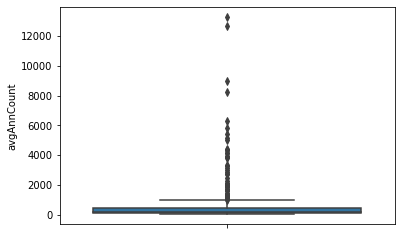

In [32]:
q1 = X_test.avgAnnCount.quantile(0.25)                 
q3 = X_test.avgAnnCount.quantile(0.75)
iqr = q3 - q1
whisker_width = 1.5
lower_whisker = q1 - whisker_width*iqr
upper_whisker = q3 + whisker_width*iqr
# Apply filter with respect to IQR, including optional whiskers
outlier_avg_ann_train = X_test[(X_test.avgAnnCount < q1 - whisker_width*iqr) | (X_test.avgAnnCount  > q3 + whisker_width*iqr)]
outlier_avg_ann_train

# boxplot with 1.5 whiskers
sns.boxplot(y='avgAnnCount', data = X_test, whis=1.5)

In [33]:
X_test.loc[X_test.avgAnnCount>upper_whisker,'avgAnnCount'] = upper_whisker

# Bottom / Zero coding - ceiling the lower limit of the column with lower whisker or zero

X_test.loc[X_test.avgAnnCount<0,'avgAnnCount'] = 0


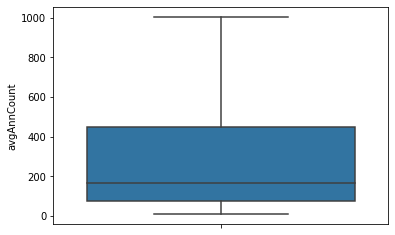

In [34]:
sns.boxplot(y='avgAnnCount', data = X_test, whis=1.5)

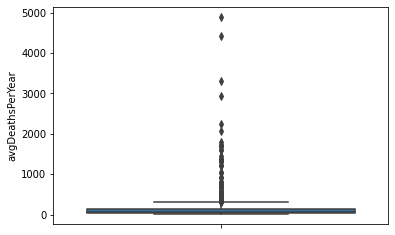

In [35]:
# Calculate Q1, Q2 and IQR
q1_avgD = X_test.avgDeathsPerYear.quantile(0.25)                 
q3_avgD = X_test.avgDeathsPerYear.quantile(0.75)
iqr_avgD = q3_avgD - q1_avgD
whisker_width_avgD = 1.5
lower_whisker_avgD = q1_avgD - whisker_width_avgD*iqr_avgD
upper_whisker_avgD = q3_avgD + whisker_width_avgD*iqr_avgD
# Apply filter with respect to IQR, including optional whiskers
outlier_avg_death_train = X_test[(X_test.avgDeathsPerYear < q1_avgD - whisker_width_avgD*iqr_avgD) | (X_test.avgDeathsPerYear  > q3_avgD + whisker_width_avgD*iqr_avgD)]
outlier_avg_death_train

# boxplot with 1.5 whiskers
sns.boxplot(y='avgDeathsPerYear', data = X_test, whis=1.5)

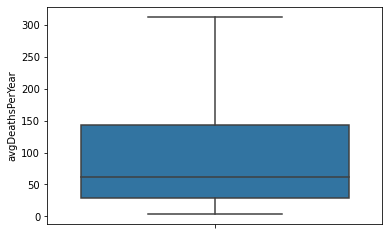

In [36]:
X_test.loc[X_test.avgDeathsPerYear>upper_whisker_avgD,'avgDeathsPerYear'] = upper_whisker_avgD

X_test.loc[X_test.avgDeathsPerYear<0,'avgDeathsPerYear'] = 0
sns.boxplot(y='avgDeathsPerYear', data = X_test, whis=1.5)

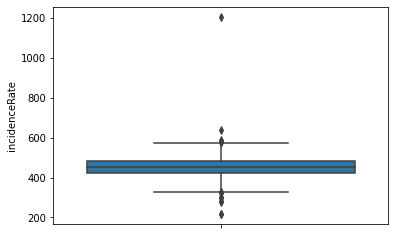

In [37]:
q1_inc = X_test.incidenceRate.quantile(0.25)                 
q3_inc = X_test.incidenceRate.quantile(0.75)
iqr_inc = q3_inc - q1_inc
whisker_width_inc = 1.5
lower_whisker_inc = q1_inc - whisker_width_inc*iqr_inc
upper_whisker_inc = q3_inc + whisker_width_inc*iqr_inc
# Apply filter with respect to IQR, including optional whiskers
outlier_inc_train = X_test[(X_test.incidenceRate < q1_inc - whisker_width_inc*iqr_inc) | (X_test.incidenceRate  > q3_inc + whisker_width_inc*iqr_inc)]


# boxplot with 1.5 whiskers
sns.boxplot(y='incidenceRate', data = X_test, whis=1.5)

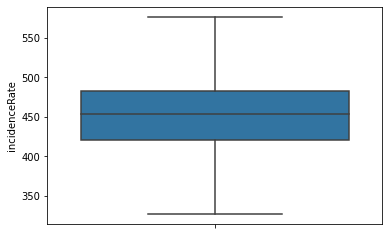

In [38]:
X_test.loc[X_test.incidenceRate>upper_whisker_inc,'incidenceRate'] = upper_whisker_inc
X_test.loc[X_test.incidenceRate<lower_whisker_inc,'incidenceRate'] = lower_whisker_inc

X_test.loc[X_test.incidenceRate<0,'incidenceRate'] = 0
sns.boxplot(y='incidenceRate', data = X_test, whis=1.5)

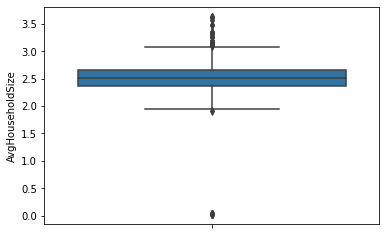

In [39]:
sns.boxplot(y='AvgHouseholdSize', data = X_test, whis=1.5)

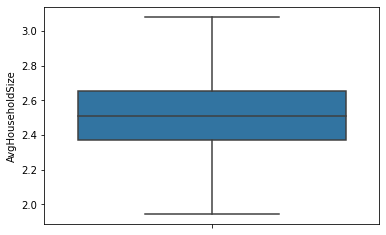

In [40]:
q1_c = X_test.AvgHouseholdSize.quantile(0.25)                 
q3_c = X_test.AvgHouseholdSize.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = X_test[(X_test.AvgHouseholdSize < q1_c - whisker_width_c*iqr_c) | (X_test.AvgHouseholdSize  > q3_c + whisker_width_c*iqr_c)]
X_test.loc[X_test.AvgHouseholdSize > upper_whisker_c, 'AvgHouseholdSize'] = upper_whisker_c
X_test.loc[X_test.AvgHouseholdSize<lower_whisker_c,'AvgHouseholdSize'] = lower_whisker_c

X_test.loc[X_test.AvgHouseholdSize < 0, 'AvgHouseholdSize'] = 0
sns.boxplot(y='AvgHouseholdSize', data = X_test, whis=1.5)

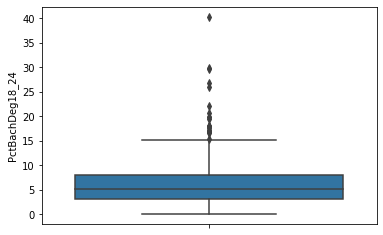

In [41]:
sns.boxplot(y='PctBachDeg18_24', data = X_test, whis=1.5)

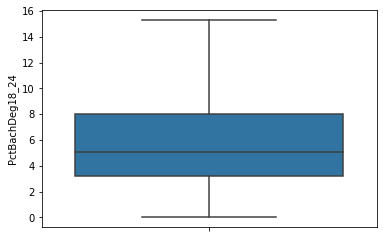

In [42]:
q1_c = X_test.PctBachDeg18_24.quantile(0.25)                 
q3_c = X_test.PctBachDeg18_24.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = X_test[(X_test.PctBachDeg18_24 < q1_c - whisker_width_c*iqr_c) | (X_test.PctBachDeg18_24  > q3_c + whisker_width_c*iqr_c)]
X_test.loc[X_test.PctBachDeg18_24 > upper_whisker_c, 'PctBachDeg18_24'] = upper_whisker_c

X_test.loc[X_test.PctBachDeg18_24 < 0, 'PctBachDeg18_24'] = 0
sns.boxplot(y='PctBachDeg18_24', data = X_test, whis=1.5)

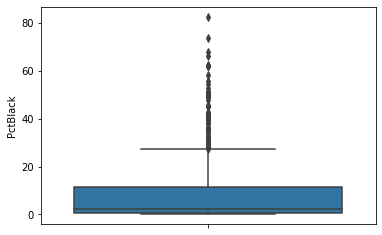

In [43]:
sns.boxplot(y='PctBlack', data = X_test, whis=1.5)

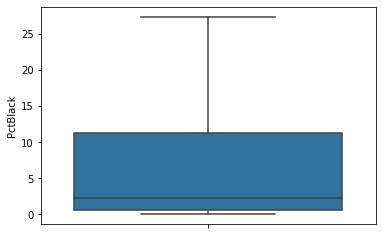

In [44]:
q1_c = X_test.PctBlack.quantile(0.25)                 
q3_c = X_test.PctBlack.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = X_test[(X_test.PctBlack < q1_c - whisker_width_c*iqr_c) | (X_test.PctBlack  > q3_c + whisker_width_c*iqr_c)]
X_test.loc[X_test.PctBlack > upper_whisker_c, 'PctBlack'] = upper_whisker_c

X_test.loc[X_test.PctBlack < 0, 'PctBlack'] = 0
sns.boxplot(y='PctBlack', data = X_test, whis=1.5)

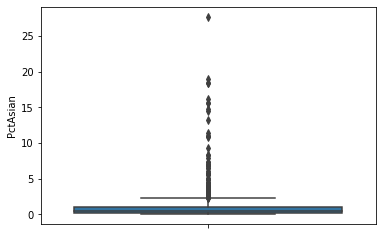

In [45]:
sns.boxplot(y='PctAsian', data = X_test, whis=1.5)

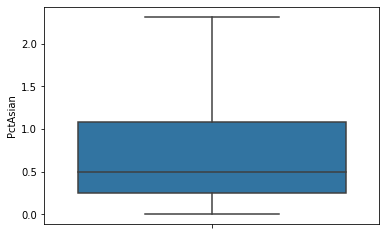

In [46]:
q1_c = X_test.PctAsian.quantile(0.25)                 
q3_c = X_test.PctAsian.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = X_test[(X_test.PctAsian < q1_c - whisker_width_c*iqr_c) | (X_test.PctAsian  > q3_c + whisker_width_c*iqr_c)]
X_test.loc[X_test.PctAsian > upper_whisker_c, 'PctAsian'] = upper_whisker_c

X_test.loc[X_test.PctAsian < 0, 'PctAsian'] = 0
sns.boxplot(y='PctAsian', data = X_test, whis=1.5)

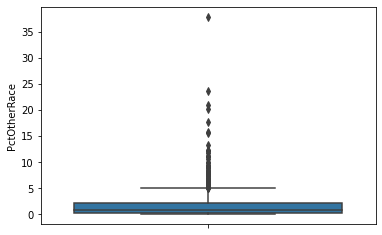

In [47]:
sns.boxplot(y='PctOtherRace', data = X_test, whis=1.5)

In [48]:
q1_c = X_test.PctOtherRace.quantile(0.25)                 
q3_c = X_test.PctOtherRace.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = X_test[(X_test.PctOtherRace < q1_c - whisker_width_c*iqr_c) | (X_test.PctOtherRace  > q3_c + whisker_width_c*iqr_c)]
X_test.loc[X_test.PctOtherRace > upper_whisker_c, 'PctOtherRace'] = upper_whisker_c
#X_test.loc[X_test.PctBachDeg18_24<lower_whisker_c,'PctBachDeg18_24'] = lower_whisker_c

X_test.loc[X_test.PctOtherRace < 0, 'PctOtherRace'] = 0

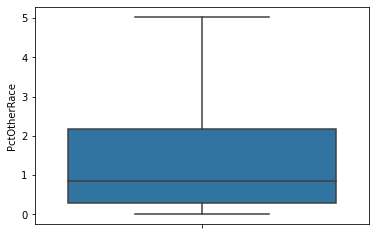

In [49]:
sns.boxplot(y='PctOtherRace', data = X_test, whis=1.5)

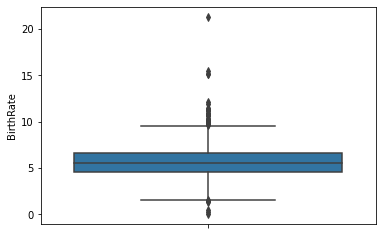

In [50]:
sns.boxplot(y='BirthRate', data = X_test, whis=1.5)

In [51]:
q1_c = X_test.BirthRate.quantile(0.25)                 
q3_c = X_test.BirthRate.quantile(0.75)
iqr_c = q3_c - q1_c
whisker_width_c = 1.5
lower_whisker_c = q1_c - whisker_width_c*iqr_c
upper_whisker_c = q3_c + whisker_width_c*iqr_c
outlier_c_train = X_test[(X_test.BirthRate < q1_c - whisker_width_c*iqr_c) | (X_test.BirthRate  > q3_c + whisker_width_c*iqr_c)]
X_test.loc[X_test.BirthRate > upper_whisker_c, 'BirthRate'] = upper_whisker_c
X_test.loc[X_test.BirthRate<lower_whisker_c,'BirthRate'] = lower_whisker_c

X_test.loc[X_test.BirthRate < 0, 'BirthRate'] = 0

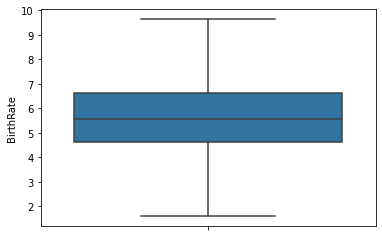

In [52]:
sns.boxplot(y='BirthRate', data = X_test, whis=1.5)

## Task 3

### Build any Machine Learning Model of your choice

Linear Regression

In [65]:
model_reg=LinearRegression()
model_reg.fit(Xtrain,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

### Evaluate your model with various Evaluation Metrics

In [66]:
train_pred = model_reg.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred)))
r2 = r2_score(y_train, train_pred)

In [67]:
#MAE
print(metrics.mean_absolute_error(y_train, train_pred))

#print result of MSE
print(metrics.mean_squared_error(y_train, train_pred))

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

13.652982317853851
349.68204753210966
RMSE is 18.699787365959796
R2 score is 0.5302246916864357


In [68]:
test_pred = model_reg.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred)))
r2_t = r2_score(y_test, test_pred)

#MAE
print(metrics.mean_absolute_error(y_test, test_pred))

#print result of MSE
print(metrics.mean_squared_error(y_test, test_pred))

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

14.705375914943684
419.4172223481349
RMSE is 20.479678277456774
R2 score is 0.4895235250092226


### Try out other Machine Learning Models and Evaluate them

Gradient Boosting Regressor

In [69]:
from sklearn.ensemble import GradientBoostingRegressor
reg = GradientBoostingRegressor()
reg.fit(Xtrain, y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [70]:
train_pred_reg = reg.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_reg)))
r2 = r2_score(y_train, train_pred_reg)

print(metrics.mean_absolute_error(y_train, train_pred_reg))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_reg))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

9.508966286747631
155.46258841956612
RMSE is 12.46846375539369
R2 score is 0.79114602559252


In [71]:
test_pred_reg = reg.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_reg)))
r2_t = r2_score(y_test, test_pred_reg)

print(metrics.mean_absolute_error(y_test, test_pred_reg))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_reg))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

12.364821273476093
290.7468880951985
RMSE is 17.051301653985202
R2 score is 0.6461293465288837


KNeighbors Regressor

In [73]:
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor()
neigh.fit(Xtrain, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

In [74]:
train_pred_neigh = neigh.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_neigh)))
r2 = r2_score(y_train, train_pred_neigh)

print(metrics.mean_absolute_error(y_train, train_pred_neigh))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_neigh))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

14.69072131147541
390.69370131147537
RMSE is 19.765973320620347
R2 score is 0.47512817633878535


In [75]:
test_pred_neigh = neigh.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_neigh)))
r2_t = r2_score(y_test, test_pred_neigh)

print(metrics.mean_absolute_error(y_test, test_pred_neigh))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_neigh))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

19.544386252045825
703.7650193126024
RMSE is 26.528569869342796
R2 score is 0.14344126292859838


Decission Tree Regressor

In [76]:
from sklearn.tree import DecisionTreeRegressor
dec=DecisionTreeRegressor()
dec.fit(Xtrain,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [77]:
train_pred_dec = dec.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_dec)))
r2 = r2_score(y_train, train_pred_dec)

print(metrics.mean_absolute_error(y_train, train_pred_dec))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_dec))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

1.7472362354756562e-16
4.9659440590962054e-30
RMSE is 2.2284398262228677e-15
R2 score is 1.0


In [78]:
test_pred_dec = dec.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_dec)))
r2_t = r2_score(y_test, test_pred_dec)

print(metrics.mean_absolute_error(y_test, test_pred_dec))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_dec))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

12.48707037643208
499.9282815057283
RMSE is 22.359076043202865
R2 score is 0.39153279051709367


Random Forest Regressor

In [79]:
from sklearn.ensemble import RandomForestRegressor

randf=RandomForestRegressor()
randf.fit(Xtrain,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [80]:
train_pred_randf = randf.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_randf)))
r2 = r2_score(y_train, train_pred_randf)

print(metrics.mean_absolute_error(y_train, train_pred_randf))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_randf))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

3.8011815573770336
31.21027093893433
RMSE is 5.586615338372092
R2 score is 0.9580710112047104


In [81]:
test_pred_randf = randf.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_randf)))
r2_t = r2_score(y_test, test_pred_randf)

print(metrics.mean_absolute_error(y_test, test_pred_randf))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_randf))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

10.655648117839608
254.76874220130927
RMSE is 15.961476817679161
R2 score is 0.6899186716066505


In [89]:
rf1=RandomForestRegressor(random_state=1)
rf1.fit(Xtrain,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=1, verbose=0, warm_start=False)

In [90]:
train_pred_rf1 = rf1.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_rf1)))
r2 = r2_score(y_train, train_pred_rf1)

print(metrics.mean_absolute_error(y_train, train_pred_rf1))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_rf1))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

3.7777618852458916
31.293409378278607
RMSE is 5.594051249164473
R2 score is 0.9579593200662854


In [91]:
test_pred_rf1 = rf1.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_rf1)))
r2_t = r2_score(y_test, test_pred_rf1)

print(metrics.mean_absolute_error(y_test, test_pred_rf1))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_rf1))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

10.79464975450082
266.729038623568
RMSE is 16.33184125025614
R2 score is 0.6753616872193675


## Task 4

### Perform Hyperparameter Tuning

Using Randomized Serch CV on Gradient boosting Regressor

In [82]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
def print_results(results):
    print('BEST PARAMS: {}\n'.format(results.best_params_))
  
    means = results.cv_results_['mean_test_score']
    stds = results.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, results.cv_results_['params']):
        print('{} (+/-{}) for {}'.format(round(mean, 3), round(std * 2, 3), params))

parameters = {
    'n_estimators': [ 150, 250, 300],
    'max_depth': [2, 3, 4, 8],
    'learning_rate': [0.03, 0.1, 0.3]
}
rs = RandomizedSearchCV(reg, parameters, cv=5,n_iter=20)
rs.fit(Xtrain, y_train)

print_results(rs)

BEST PARAMS: {'n_estimators': 300, 'max_depth': 4, 'learning_rate': 0.1}

0.629 (+/-0.049) for {'n_estimators': 150, 'max_depth': 4, 'learning_rate': 0.03}
0.718 (+/-0.046) for {'n_estimators': 250, 'max_depth': 2, 'learning_rate': 0.3}
0.73 (+/-0.049) for {'n_estimators': 300, 'max_depth': 2, 'learning_rate': 0.3}
0.669 (+/-0.052) for {'n_estimators': 150, 'max_depth': 8, 'learning_rate': 0.3}
0.75 (+/-0.047) for {'n_estimators': 300, 'max_depth': 4, 'learning_rate': 0.1}
0.74 (+/-0.065) for {'n_estimators': 250, 'max_depth': 3, 'learning_rate': 0.3}
0.72 (+/-0.049) for {'n_estimators': 150, 'max_depth': 4, 'learning_rate': 0.1}
0.521 (+/-0.052) for {'n_estimators': 150, 'max_depth': 2, 'learning_rate': 0.03}
0.723 (+/-0.068) for {'n_estimators': 150, 'max_depth': 3, 'learning_rate': 0.3}
0.699 (+/-0.048) for {'n_estimators': 300, 'max_depth': 8, 'learning_rate': 0.1}
0.704 (+/-0.052) for {'n_estimators': 300, 'max_depth': 8, 'learning_rate': 0.03}
0.744 (+/-0.044) for {'n_estimators'

#Evaluate your model

In [83]:
train_pred_rs = rs.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_rs)))
r2 = r2_score(y_train, train_pred_rs)

print(metrics.mean_absolute_error(y_train, train_pred_rs))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_rs))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

3.316331415483714
18.62979802736561
RMSE is 4.316224974137192
R2 score is 0.9749720662702266


In [84]:
test_pred_rs = rs.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_rs)))
r2_t = r2_score(y_test, test_pred_rs)

print(metrics.mean_absolute_error(y_test, test_pred_rs))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_rs))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

9.182120199409246
189.4670712511107
RMSE is 13.764703819955978
R2 score is 0.7693979228663794


Using GridSearchCV with Gradient Boosting Regressor

In [86]:
parameters = {
  
    'n_estimators': [ 150, 250, 300,350],
    'max_depth': [2, 3, 4, 8,12],
    'learning_rate': [0.03, 0.1, 0.3]
}
gs = GridSearchCV(reg, parameters, cv=5)
gs.fit(Xtrain, y_train)

print_results(gs)

BEST PARAMS: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 350}

0.521 (+/-0.052) for {'learning_rate': 0.03, 'max_depth': 2, 'n_estimators': 150}
0.557 (+/-0.061) for {'learning_rate': 0.03, 'max_depth': 2, 'n_estimators': 250}
0.569 (+/-0.058) for {'learning_rate': 0.03, 'max_depth': 2, 'n_estimators': 300}
0.581 (+/-0.053) for {'learning_rate': 0.03, 'max_depth': 2, 'n_estimators': 350}
0.578 (+/-0.041) for {'learning_rate': 0.03, 'max_depth': 3, 'n_estimators': 150}
0.617 (+/-0.047) for {'learning_rate': 0.03, 'max_depth': 3, 'n_estimators': 250}
0.632 (+/-0.048) for {'learning_rate': 0.03, 'max_depth': 3, 'n_estimators': 300}
0.645 (+/-0.049) for {'learning_rate': 0.03, 'max_depth': 3, 'n_estimators': 350}
0.63 (+/-0.048) for {'learning_rate': 0.03, 'max_depth': 4, 'n_estimators': 150}
0.669 (+/-0.045) for {'learning_rate': 0.03, 'max_depth': 4, 'n_estimators': 250}
0.68 (+/-0.044) for {'learning_rate': 0.03, 'max_depth': 4, 'n_estimators': 300}
0.692 (+/-0.045) for {'lea

#Evaluate your model

In [87]:
train_pred_gs = gs.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_gs)))
r2 = r2_score(y_train, train_pred_gs)

print(metrics.mean_absolute_error(y_train, train_pred_gs))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_gs))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

2.8385246876876944
13.934006317823556
RMSE is 3.7328281929153335
R2 score is 0.981280559982429


In [88]:
test_pred_gs = gs.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_gs)))
r2_t = r2_score(y_test, test_pred_gs)

print(metrics.mean_absolute_error(y_test, test_pred_gs))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_gs))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

8.911203490350433
185.77830287442788
RMSE is 13.630051462647817
R2 score is 0.7738875560470205


RandomizedSerachCV with Random Forest Regressor(randf)

In [97]:
parameters = {
    'bootstrap': [True],
    'max_depth': [10, 20,30,40],
    'min_samples_leaf': [3, 4,5,6,7,8],
    'min_samples_split': [4, 6,7,8,10],
    'n_estimators': [ 100, 200,250,300,400]
}
gs_randf = RandomizedSearchCV(randf, parameters, cv=5)
gs_randf.fit(Xtrain, y_train)

print_results(gs_randf)

BEST PARAMS: {'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_depth': 20, 'bootstrap': True}

0.607 (+/-0.044) for {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 8, 'max_depth': 30, 'bootstrap': True}
0.652 (+/-0.048) for {'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_depth': 20, 'bootstrap': True}
0.609 (+/-0.044) for {'n_estimators': 250, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_depth': 20, 'bootstrap': True}
0.621 (+/-0.032) for {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_depth': 20, 'bootstrap': True}
0.652 (+/-0.037) for {'n_estimators': 200, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_depth': 40, 'bootstrap': True}
0.634 (+/-0.043) for {'n_estimators': 300, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_depth': 20, 'bootstrap': True}
0.61 (+/-0.043) for {'n_estimators': 250, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_depth': 30, 'bootstrap': True}

#Evaluate your model

In [98]:
train_pred_gs_randf = gs_randf.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_gs_randf)))
r2 = r2_score(y_train, train_pred_gs_randf)

print(metrics.mean_absolute_error(y_train, train_pred_gs_randf))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_gs_randf))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

4.9371410426863696
58.09136945663038
RMSE is 7.621769443943472
R2 score is 0.9219579867212376


In [99]:
test_pred_gs_randf = gs_randf.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_gs_randf)))
r2_t = r2_score(y_test, test_pred_gs_randf)

print(metrics.mean_absolute_error(y_test, test_pred_gs_randf))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_gs_randf))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

10.960149632032328
257.24651664553426
RMSE is 16.038906341940347
R2 score is 0.6869029500370191


GridsearchCV with Random Forest rEgressor (randf)

In [100]:
from sklearn.model_selection import GridSearchCV

parameters = {
    'bootstrap': [True],
    'max_depth': [10, 20,30],
    'min_samples_leaf': [3, 4],
    'min_samples_split': [4, 6],
    'n_estimators': [ 100, 200]
}
cv_randf = GridSearchCV(randf, parameters, cv=3, n_jobs=-1,verbose=2)
cv_randf.fit(Xtrain, y_train)

cv_randf.best_params_

Fitting 3 folds for each of 24 candidates, totalling 72 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  72 out of  72 | elapsed:  3.1min finished


{'bootstrap': True,
 'max_depth': 20,
 'min_samples_leaf': 3,
 'min_samples_split': 4,
 'n_estimators': 200}

#Evaluate your model

In [101]:
train_pred_cv = cv_randf.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_cv)))
r2 = r2_score(y_train, train_pred_cv)

print(metrics.mean_absolute_error(y_train, train_pred_cv))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_cv))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

4.9380437356094875
58.04704095622523
RMSE is 7.6188608699874045
R2 score is 0.9220175392063934


In [102]:
test_pred_cv = cv_randf.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_cv)))
r2_t = r2_score(y_test, test_pred_cv)

print(metrics.mean_absolute_error(y_test, test_pred_cv))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_cv))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

10.944636898887238
259.33408543714927
RMSE is 16.10385312393122
R2 score is 0.6843621512780214


Randomized Search with Random Forest Regressor rf1

In [103]:
parameters = {
    'bootstrap': [True],
    'max_depth': [10, 20,30,40],
    'min_samples_leaf': [3, 4,5,6,7,8],
    'min_samples_split': [4, 6,7,8,10],
    'n_estimators': [ 100, 200,250,300,400]
}
rs_rf1 = RandomizedSearchCV(rf1, parameters, cv=5)
rs_rf1.fit(Xtrain, y_train)

print_results(gs_randf)

BEST PARAMS: {'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_depth': 20, 'bootstrap': True}

0.607 (+/-0.044) for {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 8, 'max_depth': 30, 'bootstrap': True}
0.652 (+/-0.048) for {'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_depth': 20, 'bootstrap': True}
0.609 (+/-0.044) for {'n_estimators': 250, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_depth': 20, 'bootstrap': True}
0.621 (+/-0.032) for {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_depth': 20, 'bootstrap': True}
0.652 (+/-0.037) for {'n_estimators': 200, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_depth': 40, 'bootstrap': True}
0.634 (+/-0.043) for {'n_estimators': 300, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_depth': 20, 'bootstrap': True}
0.61 (+/-0.043) for {'n_estimators': 250, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_depth': 30, 'bootstrap': True}

#Evaluate your model

In [104]:
train_pred_rs_rf1 = rs_rf1.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_rs_rf1)))
r2 = r2_score(y_train, train_pred_rs_rf1)

print(metrics.mean_absolute_error(y_train, train_pred_rs_rf1))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_rs_rf1))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

5.628415244980103
75.34624960444732
RMSE is 8.680221748575743
R2 score is 0.8987771666060443


In [111]:
test_pred_rs_rf1  = rs_rf1.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_rs_rf1)))
r2_t = r2_score(y_test, test_pred_rs_rf1)

print(metrics.mean_absolute_error(y_test, test_pred_rs_rf1))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_rs_rf1))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))



11.217657668200731
266.6993230195517
RMSE is 16.330931480462212
R2 score is 0.6753978543483793


GridSearchCV with Random Forest Regressor rf1

In [109]:
parameters = {
    'bootstrap': [True],
    'max_depth': [10, 15,20],
    'min_samples_leaf': [ 4,6],
    'min_samples_split': [3,4, 6],
    'n_estimators': [ 100, 200]
}
cv_rf1 = GridSearchCV(rf1, parameters, cv=3, n_jobs=-1,verbose=2)
cv_rf1.fit(Xtrain, y_train)

cv_rf1.best_params_

Fitting 3 folds for each of 36 candidates, totalling 108 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 108 out of 108 | elapsed:  4.3min finished


{'bootstrap': True,
 'max_depth': 20,
 'min_samples_leaf': 4,
 'min_samples_split': 3,
 'n_estimators': 200}

#Evaluate your model

In [110]:
train_pred_cv_rf1 = cv_rf1.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_cv_rf1)))
r2 = r2_score(y_train, train_pred_cv_rf1)

print(metrics.mean_absolute_error(y_train, train_pred_cv_rf1))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_cv_rf1))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

5.629720027037003
75.7126853920499
RMSE is 8.70130366048961
R2 score is 0.8982848837270317


In [112]:
test_pred_cv_rf1 = cv_rf1.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_cv_rf1)))
r2_t = r2_score(y_test, test_pred_cv)

print(metrics.mean_absolute_error(y_test, test_pred_cv_rf1))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_cv_rf1))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

11.212260977554138
267.735183564669
RMSE is 16.36261542555679
R2 score is 0.6843621512780214


Decission Tree GridSearchCV

In [113]:
parameters = {
    'min_samples_leaf': [4,6],
    'min_samples_split': [6,8],
    'max_depth': [8,10,15,20,25,30],
}

gs_dec = GridSearchCV(dec, parameters, cv=5, n_jobs=-1,verbose=2)
gs_dec.fit(Xtrain, y_train)

print_results(gs_dec)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    3.2s


BEST PARAMS: {'max_depth': 8, 'min_samples_leaf': 6, 'min_samples_split': 8}

0.418 (+/-0.039) for {'max_depth': 8, 'min_samples_leaf': 4, 'min_samples_split': 6}
0.414 (+/-0.048) for {'max_depth': 8, 'min_samples_leaf': 4, 'min_samples_split': 8}
0.442 (+/-0.045) for {'max_depth': 8, 'min_samples_leaf': 6, 'min_samples_split': 6}
0.442 (+/-0.042) for {'max_depth': 8, 'min_samples_leaf': 6, 'min_samples_split': 8}
0.417 (+/-0.021) for {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 6}
0.41 (+/-0.024) for {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 8}
0.437 (+/-0.037) for {'max_depth': 10, 'min_samples_leaf': 6, 'min_samples_split': 6}
0.437 (+/-0.036) for {'max_depth': 10, 'min_samples_leaf': 6, 'min_samples_split': 8}
0.406 (+/-0.062) for {'max_depth': 15, 'min_samples_leaf': 4, 'min_samples_split': 6}
0.411 (+/-0.046) for {'max_depth': 15, 'min_samples_leaf': 4, 'min_samples_split': 8}
0.434 (+/-0.048) for {'max_depth': 15, 'min_samples_leaf': 6, 'min_

[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:    6.0s finished


### Evaluate your model 

In [114]:
#Evaluating decision tree grid search cv
train_pred_gs_dec = gs_dec.predict(Xtrain)
rmse = (np.sqrt(mean_squared_error(y_train, train_pred_gs_dec)))
r2 = r2_score(y_train, train_pred_gs_dec)

print(metrics.mean_absolute_error(y_train, train_pred_gs_dec))  #MAE

print(metrics.mean_squared_error(y_train, train_pred_gs_dec))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

10.558420291583484
202.2098137931245
RMSE is 14.220049711345052
R2 score is 0.7283441392284495


In [115]:
test_pred_gs_dec = gs_dec.predict(X_test)
rmse_t = (np.sqrt(mean_squared_error(y_test, test_pred_gs_dec)))
r2_t = r2_score(y_test, test_pred_gs_dec)

print(metrics.mean_absolute_error(y_test, test_pred_gs_dec))  #MAE

print(metrics.mean_squared_error(y_test, test_pred_gs_dec))  #MSE

print('RMSE is {}'.format(rmse_t))
print('R2 score is {}'.format(r2_t))

15.80044618700178
460.0425989919254
RMSE is 21.448603660656453
R2 score is 0.4400780135726866


## Task 5

### Use any Feature Selection Technique and observe if the model created by selected features performs better than the previous model

XBoost

Feature Importances :  [0.03022876 0.03299441 0.03123798 0.02972892 0.02647332 0.03823277
 0.02752765 0.03174507 0.03218688 0.03375743 0.03245205 0.03489545
 0.03333937 0.03516804 0.03228571 0.03520498 0.03679341 0.03817744
 0.03496602 0.03459756 0.03810538 0.03112031 0.03186511 0.0344387
 0.03544676 0.02859849 0.02792255 0.02789683 0.02785881 0.02803216
 0.02672167]


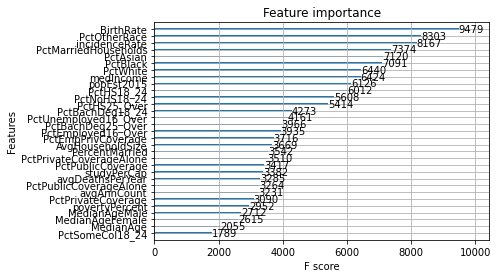

In [116]:
from xgboost import XGBClassifier
from xgboost import plot_importance

# fit model to training data
xgb_model = XGBClassifier(random_state = 0 )
xgb_model.fit(Xtrain, y_train)

print("Feature Importances : ", xgb_model.feature_importances_)

# plot feature importance
plot_importance(xgb_model)
plt.show()

In [117]:
from sklearn.feature_selection import SelectFromModel
selection = SelectFromModel(xgb_model)
selection.fit(Xtrain, y_train)

# Transform the train and test features
select_X_train = selection.transform(Xtrain)
select_X_test = selection.transform(X_test) 

# train model
selection_model = XGBClassifier()
selection_model.fit(select_X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [118]:
train_pred_sel = xgb_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, train_pred_sel)))
r2 = r2_score(y_test, train_pred_sel)

print(metrics.mean_absolute_error(y_test, train_pred_sel))  #MAE

print(metrics.mean_squared_error(y_test, train_pred_sel))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

13.937970540098197
573.8009656301145
RMSE is 23.95414297423547
R2 score is 0.3016216820060972


In [119]:
predictions = selection_model.predict(select_X_test)
rmse = (np.sqrt(mean_squared_error(y_test, predictions)))
r2 = r2_score(y_test, predictions)

print(metrics.mean_absolute_error(y_test, predictions))  #MAE

print(metrics.mean_squared_error(y_test, predictions))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

14.616693944353518
618.3707692307693
RMSE is 24.867061934027696
R2 score is 0.2473753730307151


Gradient Boosting Regressor Feature importance

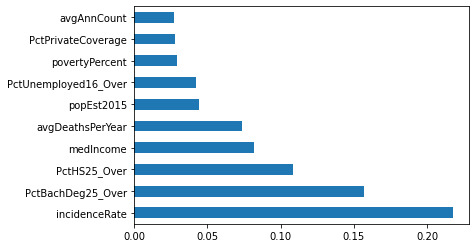

In [120]:
#Gradient Boosting Regressor
feat_importances = pd.Series(reg.feature_importances_, index=Xtrain.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [121]:
from sklearn.feature_selection import SelectFromModel
# Create a selector object that will use the random forest classifier to identify
# It will select the features based on the importance score
reg_sfm = SelectFromModel(reg)

#Alternatively if you want to set a specific threshold and select the features you may the following code that is commented
# features that have an importance of more than 0.13 ( all top 4 features lie above this)
# rf_sfm = SelectFromModel(rf_clf, threshold=0.13)

# Train the selector
reg_sfm = reg_sfm.fit(Xtrain, y_train)

In [122]:
X_important_train = reg_sfm.transform(Xtrain)
X_important_test = reg_sfm.transform(X_test)

In [123]:
reg_important = GradientBoostingRegressor()

# Train the new classifier on the new dataset containing the most important features
reg_important = reg_important.fit(X_important_train, y_train)

In [125]:
y_important_pred = reg_important.predict(X_important_test)
rmse = (np.sqrt(mean_squared_error(y_test, y_important_pred)))
r2 = r2_score(y_test, y_important_pred)


print(metrics.mean_squared_error(y_test, y_important_pred))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

317.173714708012
RMSE is 17.809371541635375
R2 score is 0.6139650180852987


Boruta

In [126]:
!pip install Boruta

     |████████████████████████████████| 61kB 6.0MB/s 


In [127]:
from boruta import BorutaPy
boruta_selector = BorutaPy(reg, n_estimators='auto', verbose=2, random_state=1)

# find all relevant features
boruta_selector.fit(np.array(Xtrain), np.array(y_train))

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	31
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	31
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	31
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	31
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	31
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	31
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	31
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	19
Tentative: 	12
Rejected: 	0
Iteration: 	9 / 100
Confirmed: 	19
Tentative: 	12
Rejected: 	0
Iteration: 	10 / 100
Confirmed: 	19
Tentative: 	11
Rejected: 	1
Iteration: 	11 / 100
Confirmed: 	19
Tentative: 	11
Rejected: 	1
Iteration: 	12 / 100
Confirmed: 	19
Tentative: 	11
Rejected: 	1
Iteration: 	13 / 100
Confirmed: 	19
Tentative: 	11
Rejected: 	1
Iteration: 	14 / 100
Confirmed: 	19
Tentative: 	11
Rejected: 	1
Iteration: 	15 / 100
Confirmed: 	19
Tentative: 	11
Rejected: 	1
Iteration: 	16 / 100
Confirmed: 	19
Tentative: 	11
Rejec

BorutaPy(alpha=0.05,
         estimator=GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                             criterion='friedman_mse',
                                             init=None, learning_rate=0.1,
                                             loss='ls', max_depth=3,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=244,
                                             n_iter_no_change=None,
                                             presort='deprecated',
                 

In [129]:
X_important_train = boruta_selector.transform(np.array(Xtrain))
X_important_test = boruta_selector.transform(np.array(X_test))

Boruta with Gradient Boosting Regressor

In [130]:
rf_important = GradientBoostingRegressor()

# Train the new classifier on the new dataset containing the most important features
rf_important.fit(X_important_train, y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [131]:
y_important_pred_bor = rf_important.predict(X_important_test)
rmse = (np.sqrt(mean_squared_error(y_test, y_important_pred_bor)))
r2 = r2_score(y_test, y_important_pred_bor)


print(metrics.mean_squared_error(y_test, y_important_pred_bor))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

294.97893933922467
RMSE is 17.174950926835997
R2 score is 0.6409784788822576


RFE

In [138]:
from sklearn.feature_selection import RFE #importing RFE class from sklearn library

rfe = RFE(estimator= reg , step = 1) 
# Fit the function for ranking the features
fit = rfe.fit(Xtrain, y_train)

In [139]:
X_train_rfe = rfe.transform(Xtrain)
X_test_rfe = rfe.transform(X_test)

# Fitting our baseline model with the transformed data
lr_rfe_model = reg.fit(X_train_rfe, y_train)

In [141]:
y_important_pred_rfe = lr_rfe_model.predict(X_test_rfe)
rmse = (np.sqrt(mean_squared_error(y_test, y_important_pred_rfe)))
r2 = r2_score(y_test, y_important_pred_rfe)


print(metrics.mean_squared_error(y_test, y_important_pred_rfe))#MSE

print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

244.28523361904624
RMSE is 15.629626790779307
R2 score is 0.7026782442266015


That is the end of this assignment. We hope you learnt a lot along the way. 
Make sure you complete the other 2 parts (leaderboard submission and quiz) as well.

Now, download this notebook and submit it on the platform: https://dphi.tech/practice/challenge/52#notebooks 
